In [1]:
from matplotlib import pyplot as plt
import matplotlib as mpl
import csv
import numpy as np
import os,sys
import PIL # for reading tif images
import h5py
import datetime as dt
import time

import psycopg2 as pg
from configparser import ConfigParser

# for using datetime on x axis
import matplotlib.dates as mdates
import matplotlib.units as munits
munits.registry[dt.datetime] = mdates.ConciseDateConverter()

# for reading the database parameters from goodlogger's my_config.cfg
goodlogger_dir = "C:\\Users\\QC\OneDrive - UW-Madison\\Documents\\LabSoftware\\GOOD_logger"

cp = ConfigParser()
cp.read(os.path.join(goodlogger_dir,"my_config.cfg"))
conn_params = {'database':cp['DATABASE_SETUP']['Database'],
                'host':cp['DATABASE_SETUP']['Host'],
                'user':cp['DATABASE_SETUP']['User'],
                'password':cp['DATABASE_SETUP']['Password'],
                'port':cp['DATABASE_SETUP']['Port']}

def get_data_in_time_interval(table, column_names, t_start, t_end):
    database = pg.connect(**conn_params)
    cur = database.cursor()

    t1 = t_start.timestamp()
    t2 = t_end.timestamp() 

    column_names = ['time'] + column_names

    cur.execute(f"SELECT {', '.join(column_names)} FROM {table} where time between {t1} and {t2}")
    row = cur.fetchone()
    rows = []
    while row is not None:
        rows.append([float(x) for x in row])
        row = cur.fetchone()
    return np.array(rows)

def get_data_most_recent(table, column_names, nrows):
    database = pg.connect(**conn_params)
    cur = database.cursor()

    column_names = ['time'] + column_names

    cur.execute(f"SELECT {', '.join(column_names)} FROM {table} ORDER BY time DESC LIMIT {nrows}")
    row = cur.fetchone()
    rows = []
    while row is not None:
        rows.append([float(x) for x in row])
        row = cur.fetchone()
    return np.array(rows)

results = "C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\"

sys.path.append("..\\")
from h5_data_utilities import * # helper functions for dealing with h5 files

## 2024.05.28

### atom loading rate from Cycler over the weekend

The loading rate fluctuated over the weekend, sometimes going to zero or close to zero, which seemed to be a discrete change. The loading rate was around 40% on Friday, and persisted for a while, but this morning, the loading rate is a few percent at best, with no change to experimental settings. Below I try to deduce the cause of this two-state behavior.

In [2]:
fnames = get_files_by_criteria(date_filters=["2024-05-2"], # only find files from these date directories
                               name_filters=["ExperimentCycler"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 18

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        if 'GeneralVariableScan' in fnames:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        else:
            print(f"file {i} ({f})")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-28\09\000014180-ExperimentCycler_atom_loading.h5, which is corrupt
found 22 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\11\000014113-ExperimentCycler.h5)
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\11\000014113-ExperimentCycler_atom_loading.h5)
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014115-ExperimentCycler.h5)
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014115-ExperimentCycler_atom_loading.h5)
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014116-ExperimentCycler.h5)
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014116-ExperimentCycler_atom_loading.h5)
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014118-ExperimentCycler.h5)
file 7 (C:\Networking Exper

In [4]:
i = 20 # shows loading coming and going nearly to zero, discretely, Friday - Tuesday morning
i = 21 # shows loading come back discretely around iteration 70

f = h5py.File(fnames[i])
# rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)

experiment: atom_loading_experiment


In [5]:
iterations = int(len(photocounts)/n_measurements)
iterations, n_measurements

(86, 100)

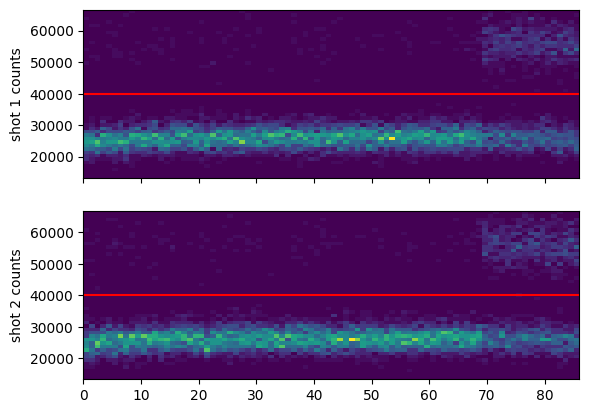

In [6]:
first_shot_hists = np.array(
    [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

second_shot_hists = np.array(
    [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

cutoff1 = cutoff2 = 40000*t_SPCM_first_shot

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes

cax=ax.imshow(first_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
ax.set_aspect('auto')
cax2=ax2.imshow(second_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax2.set_ylabel("shot 2 counts")
ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
ax2.set_aspect('auto')
# fig.colorbar(cax2)

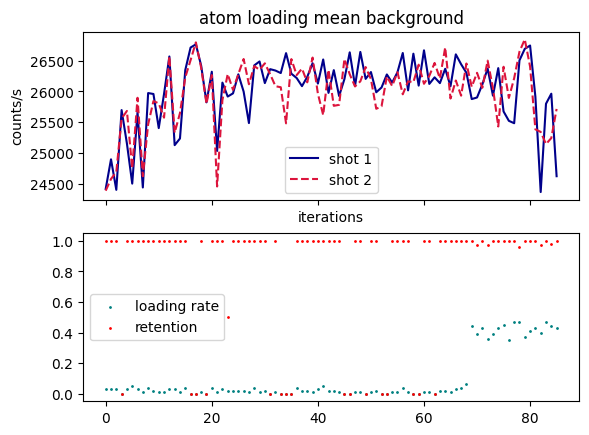

Text(0.5, 0, 'mean background, shot 1')

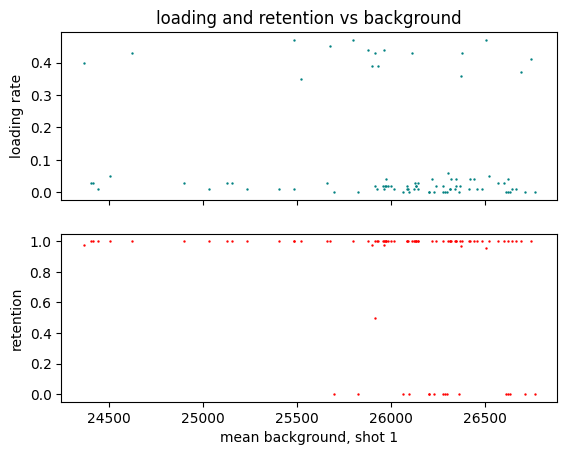

In [7]:
"""
compare mean background with loading rate.
"""

mean1_by_iteration = [np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)]
mean2_by_iteration = [np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)]

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes
ax.plot(mean1_by_iteration,color='darkblue',label='shot 1')
ax.plot(mean2_by_iteration,color='crimson',ls='--',label='shot 2')
ax.set_title("atom loading mean background")
ax.set_ylabel("counts/s")
ax.set_xlabel("iterations")

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

ax2.scatter(range(iterations), loading_rate_array, color='teal',label='loading rate', s=1)
ax2.scatter(range(iterations), retention_array, color='red', label='retention', s=1)

for axis in axes:
    axis.legend()
plt.show()

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes
ax.set_title("loading and retention vs background")
ax.scatter(mean1_by_iteration,loading_rate_array, color='teal',s=0.5)
ax.set_ylabel('loading rate')
ax2.scatter(mean1_by_iteration,retention_array, color='red',s=0.5)
ax2.set_ylabel('retention')
ax2.set_xlabel('mean background, shot 1')

In [8]:
t0 = time.time()

database = pg.connect(**conn_params)
cur = database.cursor()

t_start = dt.datetime(2024, 5, 28, 9, 34, 0) # when 000014180 was started
t_end = dt.datetime(2024, 5, 28, 12, 7, 0) # when 000014180 was stopped

points = (26+120+7)*3600*2 # 2 points every second over the course of the experiment

t1 = t_start.timestamp()
t2 = t_end.timestamp()

query = f"""
SELECT
t.time as "time",
t.ch1, t.ch2, t.ch3, t.ch4, t.ch5, t.ch6, t.ch7, t.ch8, t.ch9, t.ch10
FROM (
  SELECT time, ch1, ch2, ch3, ch4, ch5, ch6, ch7, ch8, ch9, ch10, row_number() OVER(ORDER BY 1) AS row
  FROM qn_labjack_channels
  WHERE time between {t1} and {t2}
) t
ORDER BY 1
LIMIT {points}
"""
# LIMIT 100
# WHERE t.row % 7000 = 0 --AND $__unixEpochFilter(time)

cur.execute(query)
row = cur.fetchone()
rows = []
while row is not None:
    rows.append([float(x) for x in row])
    row = cur.fetchone()

tf = time.time()
print(f"executed in {tf-t0:.2f} s")

executed in 22.71 s


In [9]:
data = np.array(rows)

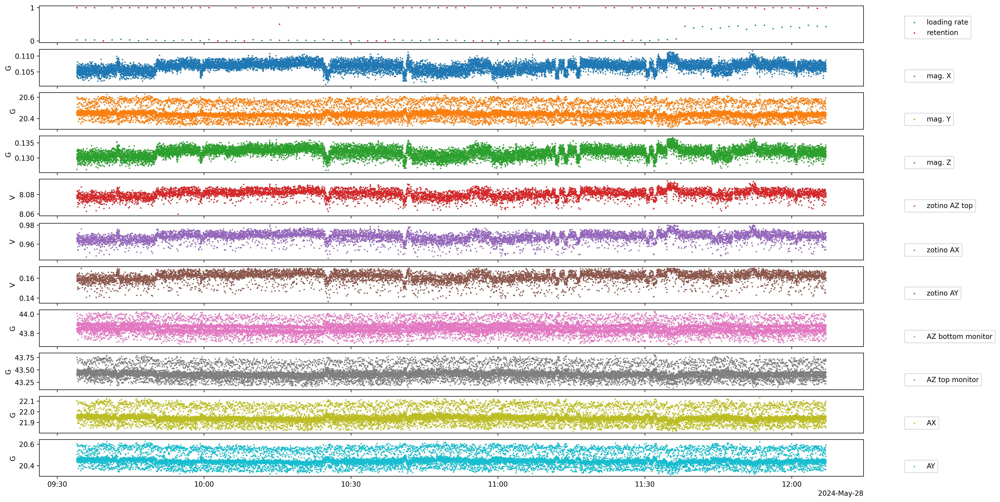

In [54]:
timesteps, magX, magY, magZ, zotAZtop, zotAX, zotAY, monitorAZbottom, monitorAZtop, monitorAX, monitorAY = data.transpose() # time is unix time in seconds
datetimes = np.array([dt.datetime.fromtimestamp(t) for t in timesteps]) # time to datetime

labels = ['mag. X','mag. Y','mag. Z','zotino AZ top','zotino AX','zotino AY','AZ bottom monitor','AZ top monitor','AX','AY']
ylabels = ['G','G','G','V','V','V','G','G','G','G']

G_per_V_SM = 1e4*35e-6 # G per T * T per V for Stefan-Mayer FLC3-70
G_per_V_AZ_bottom = 8.75/2 # G per A * A per monitor = V for the AZ top shim coil
G_per_V_AZ_top = 8.75/2 # G per A * A per monitor = V for the AZ top shim coil
G_per_V_AX = 2.27 # G per A * A per monitor = V for the AX shim coil
G_per_V_AY = 2.10 # G per A * A per monitor = V for the AY shim coil

channels = [magX*G_per_V_SM, magY*G_per_V_SM, magZ*G_per_V_SM,
            zotAZtop, zotAX, zotAY, 
            monitorAZbottom*G_per_V_AZ_bottom, monitorAZtop*G_per_V_AZ_top, monitorAX*G_per_V_AX, monitorAY*G_per_V_AY]

colors = plt.rcParams["axes.prop_cycle"]()
fig,axes = plt.subplots(nrows=len(channels)+1, constrained_layout=True,dpi=300, figsize=(20,10), sharex=True)

datetimes = np.array([dt.datetime.fromtimestamp(t) for t in np.linspace(timesteps[0], timesteps[-1], iterations)])
axes[0].scatter(datetimes, loading_rate_array, color='teal',label='loading rate', s=1)
axes[0].scatter(datetimes, retention_array, color='red', label='retention', s=1)
axes[0].legend(loc=(1.05,0.1))

datetimes = np.array([dt.datetime.fromtimestamp(t) for t in timesteps])
i = 0 # mag X
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 1 # mag Y - pretty sure the BNC cable is bad. this has been known for months
axes[i+1].scatter(datetimes,ch,label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 2 # mag Z
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 3 # zotino AZ top
thresh = 8.05 # for selecting the values that correspond to the MOT loading phase. the GOODLogger isn't triggered so it measures points throughout an experiment
axes[i+1].scatter(datetimes[channels[i] > thresh],channels[i][channels[i] > thresh],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 4 # zotino AX 
thresh = 0.94
axes[i+1].scatter(datetimes[channels[i] > thresh],channels[i][channels[i] > thresh],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 5 # zotino AY
thresh = 0.17
axes[i+1].scatter(datetimes[channels[i] < thresh],channels[i][channels[i] < thresh],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 6 # AZ bottom monitor
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 7 # AZ top monitor
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 8 # AX monitor
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 9 # AY monitor
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

# # for ax,ch,lbl,ylbl in zip(axes[1:],channels,labels,ylabels):
#     c = next(colors)["color"]
#     ax.scatter(datetimes,ch,label=lbl,color=c, s=1)
#     ax.set_ylabel(ylbl)
#     ax.legend(loc=(1.05,0.1))
# axes[4].set_ylim((6,8))
# axes[5].set_ylim((0.8,1.2))
# axes[6].set_ylim((.5,8))

## 2024.05.28

### atom loading rate from Cycler over the weekend

The loading rate fluctuated over the weekend, sometimes going to zero or close to zero, which seemed to be a discrete change. The loading rate was around 40% on Friday, and persisted for a while, but this morning, the loading rate is a few percent at best, with no change to experimental settings. Below I try to deduce the cause of this two-state behavior.

In [2]:
fnames = get_files_by_criteria(date_filters=["2024-05-2"], # only find files from these date directories
                               name_filters=["ExperimentCycler"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 18

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        if 'GeneralVariableScan' in fnames:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        else:
            print(f"file {i} ({f})")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-28\09\000014180-ExperimentCycler_atom_loading.h5, which is corrupt
found 22 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\11\000014113-ExperimentCycler.h5)
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\11\000014113-ExperimentCycler_atom_loading.h5)
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014115-ExperimentCycler.h5)
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014115-ExperimentCycler_atom_loading.h5)
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014116-ExperimentCycler.h5)
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014116-ExperimentCycler_atom_loading.h5)
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-23\13\000014118-ExperimentCycler.h5)
file 7 (C:\Networking Exper

In [4]:
i = 20 # shows loading coming and going nearly to zero, discretely, Friday - Tuesday morning
i = 21 # shows loading come back discretely around iteration 70

f = h5py.File(fnames[i])
# rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)

experiment: atom_loading_experiment


In [5]:
iterations = int(len(photocounts)/n_measurements)
iterations, n_measurements

(86, 100)

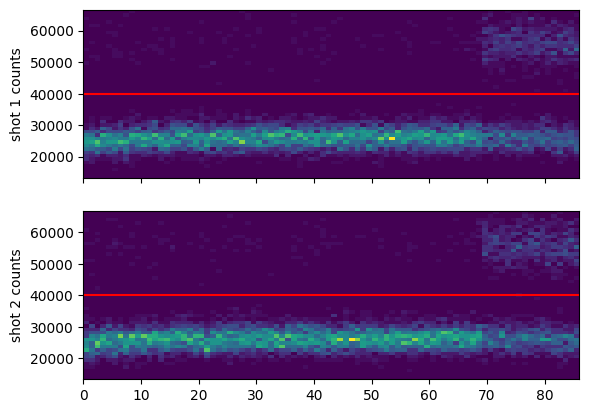

In [6]:
first_shot_hists = np.array(
    [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

second_shot_hists = np.array(
    [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

cutoff1 = cutoff2 = 40000*t_SPCM_first_shot

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes

cax=ax.imshow(first_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
ax.set_aspect('auto')
cax2=ax2.imshow(second_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax2.set_ylabel("shot 2 counts")
ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
ax2.set_aspect('auto')
# fig.colorbar(cax2)

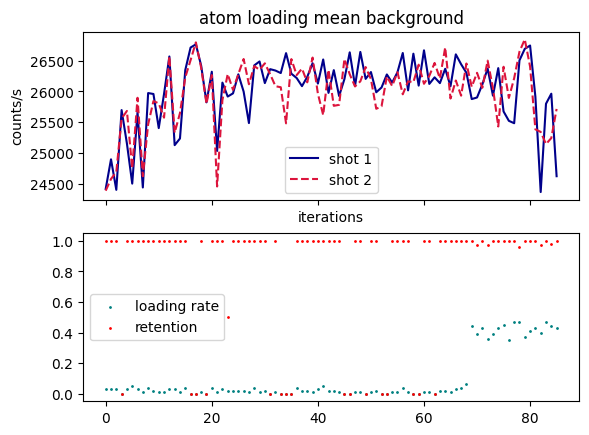

Text(0.5, 0, 'mean background, shot 1')

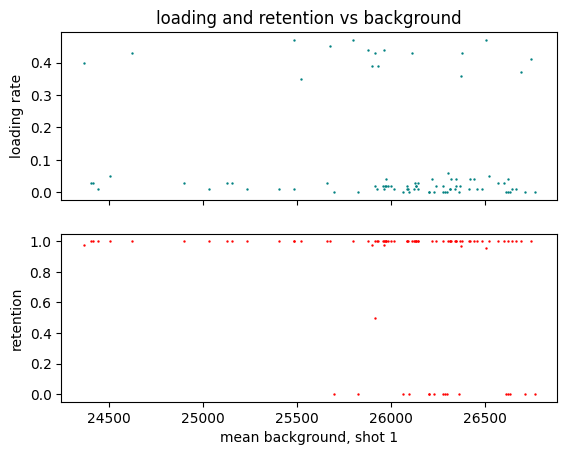

In [7]:
"""
compare mean background with loading rate.
"""

mean1_by_iteration = [np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)]
mean2_by_iteration = [np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)]

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes
ax.plot(mean1_by_iteration,color='darkblue',label='shot 1')
ax.plot(mean2_by_iteration,color='crimson',ls='--',label='shot 2')
ax.set_title("atom loading mean background")
ax.set_ylabel("counts/s")
ax.set_xlabel("iterations")

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

ax2.scatter(range(iterations), loading_rate_array, color='teal',label='loading rate', s=1)
ax2.scatter(range(iterations), retention_array, color='red', label='retention', s=1)

for axis in axes:
    axis.legend()
plt.show()

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes
ax.set_title("loading and retention vs background")
ax.scatter(mean1_by_iteration,loading_rate_array, color='teal',s=0.5)
ax.set_ylabel('loading rate')
ax2.scatter(mean1_by_iteration,retention_array, color='red',s=0.5)
ax2.set_ylabel('retention')
ax2.set_xlabel('mean background, shot 1')

In [8]:
t0 = time.time()

database = pg.connect(**conn_params)
cur = database.cursor()

t_start = dt.datetime(2024, 5, 28, 9, 34, 0) # when 000014180 was started
t_end = dt.datetime(2024, 5, 28, 12, 7, 0) # when 000014180 was stopped

points = (26+120+7)*3600*2 # 2 points every second over the course of the experiment

t1 = t_start.timestamp()
t2 = t_end.timestamp()

query = f"""
SELECT
t.time as "time",
t.ch1, t.ch2, t.ch3, t.ch4, t.ch5, t.ch6, t.ch7, t.ch8, t.ch9, t.ch10
FROM (
  SELECT time, ch1, ch2, ch3, ch4, ch5, ch6, ch7, ch8, ch9, ch10, row_number() OVER(ORDER BY 1) AS row
  FROM qn_labjack_channels
  WHERE time between {t1} and {t2}
) t
ORDER BY 1
LIMIT {points}
"""
# LIMIT 100
# WHERE t.row % 7000 = 0 --AND $__unixEpochFilter(time)

cur.execute(query)
row = cur.fetchone()
rows = []
while row is not None:
    rows.append([float(x) for x in row])
    row = cur.fetchone()

tf = time.time()
print(f"executed in {tf-t0:.2f} s")

executed in 22.71 s


In [9]:
data = np.array(rows)

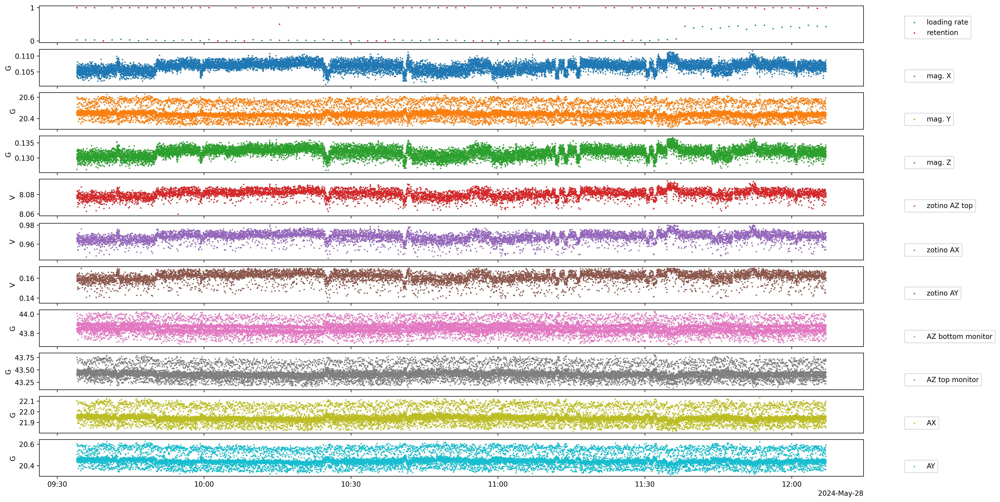

In [54]:
timesteps, magX, magY, magZ, zotAZtop, zotAX, zotAY, monitorAZbottom, monitorAZtop, monitorAX, monitorAY = data.transpose() # time is unix time in seconds
datetimes = np.array([dt.datetime.fromtimestamp(t) for t in timesteps]) # time to datetime

labels = ['mag. X','mag. Y','mag. Z','zotino AZ top','zotino AX','zotino AY','AZ bottom monitor','AZ top monitor','AX','AY']
ylabels = ['G','G','G','V','V','V','G','G','G','G']

G_per_V_SM = 1e4*35e-6 # G per T * T per V for Stefan-Mayer FLC3-70
G_per_V_AZ_bottom = 8.75/2 # G per A * A per monitor = V for the AZ top shim coil
G_per_V_AZ_top = 8.75/2 # G per A * A per monitor = V for the AZ top shim coil
G_per_V_AX = 2.27 # G per A * A per monitor = V for the AX shim coil
G_per_V_AY = 2.10 # G per A * A per monitor = V for the AY shim coil

channels = [magX*G_per_V_SM, magY*G_per_V_SM, magZ*G_per_V_SM,
            zotAZtop, zotAX, zotAY, 
            monitorAZbottom*G_per_V_AZ_bottom, monitorAZtop*G_per_V_AZ_top, monitorAX*G_per_V_AX, monitorAY*G_per_V_AY]

colors = plt.rcParams["axes.prop_cycle"]()
fig,axes = plt.subplots(nrows=len(channels)+1, constrained_layout=True,dpi=300, figsize=(20,10), sharex=True)

datetimes = np.array([dt.datetime.fromtimestamp(t) for t in np.linspace(timesteps[0], timesteps[-1], iterations)])
axes[0].scatter(datetimes, loading_rate_array, color='teal',label='loading rate', s=1)
axes[0].scatter(datetimes, retention_array, color='red', label='retention', s=1)
axes[0].legend(loc=(1.05,0.1))

datetimes = np.array([dt.datetime.fromtimestamp(t) for t in timesteps])
i = 0 # mag X
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 1 # mag Y - pretty sure the BNC cable is bad. this has been known for months
axes[i+1].scatter(datetimes,ch,label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 2 # mag Z
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 3 # zotino AZ top
thresh = 8.05 # for selecting the values that correspond to the MOT loading phase. the GOODLogger isn't triggered so it measures points throughout an experiment
axes[i+1].scatter(datetimes[channels[i] > thresh],channels[i][channels[i] > thresh],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 4 # zotino AX 
thresh = 0.94
axes[i+1].scatter(datetimes[channels[i] > thresh],channels[i][channels[i] > thresh],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 5 # zotino AY
thresh = 0.17
axes[i+1].scatter(datetimes[channels[i] < thresh],channels[i][channels[i] < thresh],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 6 # AZ bottom monitor
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 7 # AZ top monitor
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 8 # AX monitor
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

i = 9 # AY monitor
axes[i+1].scatter(datetimes,channels[i],label=labels[i],color=next(colors)["color"], s=1)
axes[i+1].set_ylabel(ylabels[i])
axes[i+1].legend(loc=(1.05,0.1))

# # for ax,ch,lbl,ylbl in zip(axes[1:],channels,labels,ylabels):
#     c = next(colors)["color"]
#     ax.scatter(datetimes,ch,label=lbl,color=c, s=1)
#     ax.set_ylabel(ylbl)
#     ax.legend(loc=(1.05,0.1))
# axes[4].set_ylim((6,8))
# axes[5].set_ylim((0.8,1.2))
# axes[6].set_ylim((.5,8))

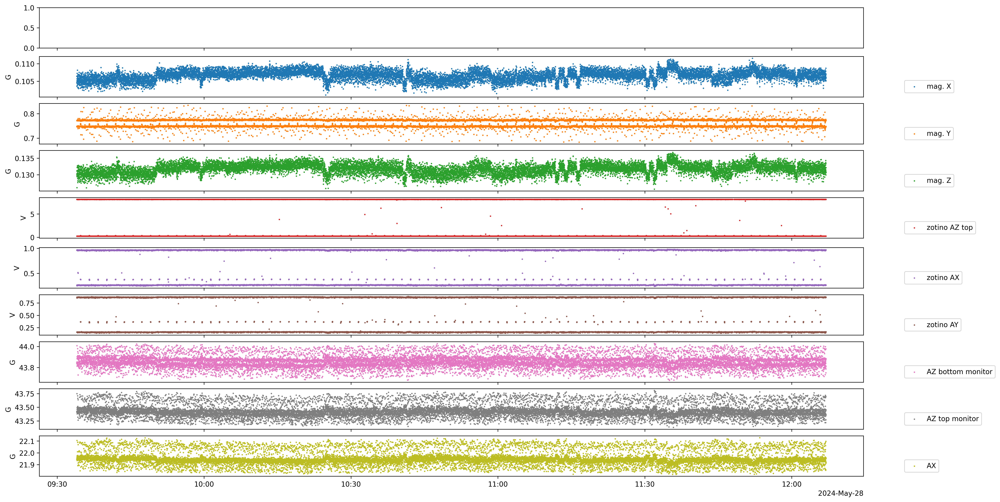

In [70]:
timesteps, magX, magY, magZ, zotAZtop, zotAX, zotAY, monitorAZbottom, monitorAZtop, monitorAX, monitorAY = data.transpose() # time is unix time in seconds
datetimes = np.array([dt.datetime.fromtimestamp(t) for t in timesteps]) # time to datetime

labels = ['mag. X','mag. Y','mag. Z','zotino AZ top','zotino AX','zotino AY','AZ bottom monitor','AZ top monitor','AX','AY']
ylabels = ['G','G','G','V','V','V','G','G','G','G']

G_per_V_SM = 1e4*35e-6 # G per T * T per V for Stefan-Mayer FLC3-70
G_per_V_AZ_bottom = 8.75/2 # G per A * A per monitor = V for the AZ top shim coil
G_per_V_AZ_top = 8.75/2 # G per A * A per monitor = V for the AZ top shim coil
G_per_V_AX = 2.27 # G per A * A per monitor = V for the AX shim coil
G_per_V_AY = 2.10 # G per A * A per monitor = V for the AY shim coil

channels = [magX*G_per_V_SM, magY*G_per_V_SM, magZ*G_per_V_SM,
            zotAZtop, zotAX, zotAY, 
            monitorAZbottom*G_per_V_AZ_bottom, monitorAZtop*G_per_V_AZ_top, monitorAX*G_per_V_AX, monitorAY*G_per_V_AY]

colors = plt.rcParams["axes.prop_cycle"]()
# 
fig,axes = plt.subplots(nrows=len(channels), constrained_layout=True,dpi=300, figsize=(20,10), sharex=True)
for ax,ch,lbl,ylbl in zip(axes[1:],channels,labels,ylabels):
    c = next(colors)["color"]
    ax.scatter(datetimes,ch,label=lbl,color=c, s=1)
    ax.set_ylabel(ylbl)
    ax.legend(loc=(1.05,0.1))
# axes[4].set_ylim((6,8))
# axes[5].set_ylim((0.8,1.2))
# axes[6].set_ylim((.5,8))

In [71]:
for i in range(5):
    try:
        5/(3-i)
    except:
        print(i)
        break

3


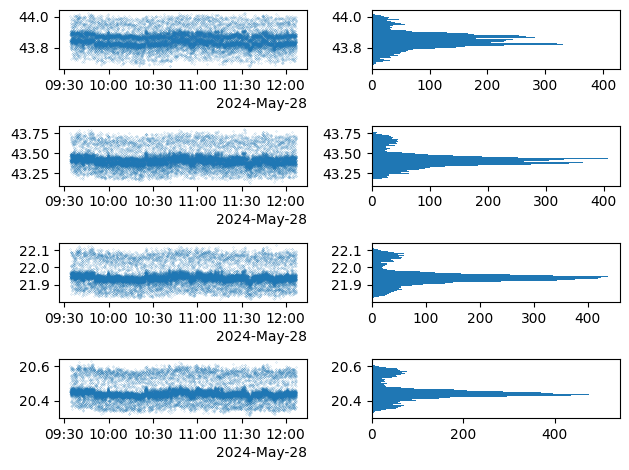

In [68]:
fig,axes = plt.subplots(nrows=4,ncols=2)
for ax,ch in zip(axes,channels[-4:]):
    ax[0].scatter(datetimes,ch,s=0.01)
    ax[1].hist(ch, orientation='horizontal',bins=200)
fig.tight_layout()

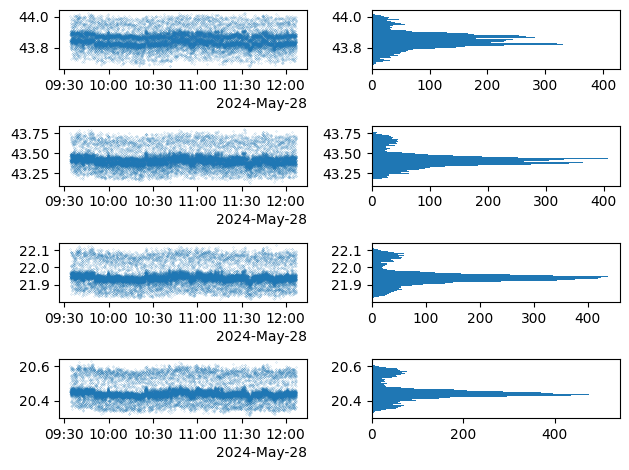

In [68]:
fig,axes = plt.subplots(nrows=4,ncols=2)
for ax,ch in zip(axes,channels[-4:]):
    ax[0].scatter(datetimes,ch,s=0.01)
    ax[1].hist(ch, orientation='horizontal',bins=200)
fig.tight_layout()

## 2024.05.20

### analyzing FORT background, atom loading, and retention from Cycler over the weekend

Below I look for correlations between the FORT background and loading rate

In [32]:
fnames = get_files_by_criteria(date_filters=["2024-05-18"], # only find files from these date directories
                               name_filters=["atom_loading"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 18

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        if 'GeneralVariableScan' in fnames:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        else:
            print(f"file {i} ({f})")

found 8 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\13\000013914-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\13\000013921-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\15\000013929-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\16\000013938-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\17\000013942-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\17\000013946-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-

In [33]:
i = 7 # experiment cycler overnight, > 14 hours of data. note: file is written all at once when experiment deleted

f = h5py.File(fnames[i])
# rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)

experiment: atom_loading_experiment


In [34]:
iterations = int(len(photocounts)/n_measurements)
iterations, n_measurements

(1219, 100)

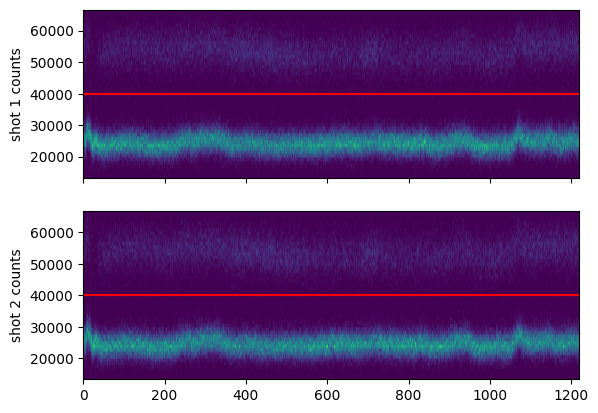

In [35]:
first_shot_hists = np.array(
    [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

second_shot_hists = np.array(
    [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

cutoff1 = cutoff2 = 40000*t_SPCM_first_shot

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes

cax=ax.imshow(first_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
ax.set_aspect('auto')
cax2=ax2.imshow(second_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax2.set_ylabel("shot 2 counts")
ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
ax2.set_aspect('auto')
# fig.colorbar(cax2)

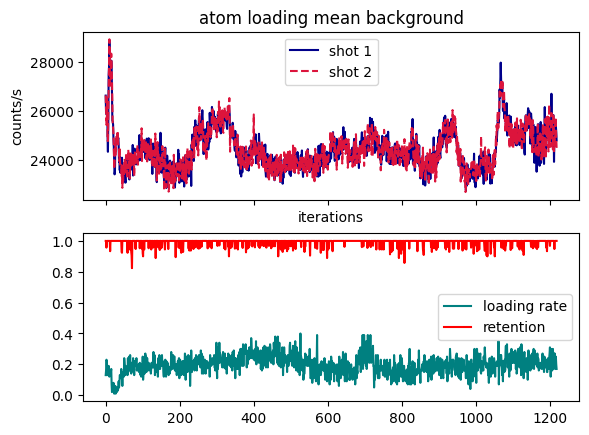

Text(0.5, 0, 'mean background, shot 1')

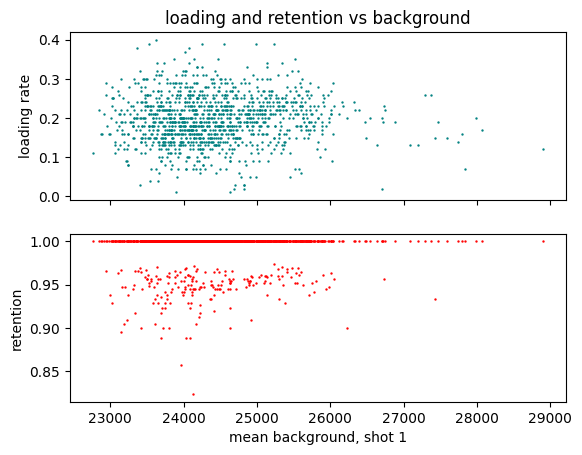

In [37]:
"""
compare mean background with loading rate.
"""

mean1_by_iteration = [np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)]
mean2_by_iteration = [np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)]

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes
ax.plot(mean1_by_iteration,color='darkblue',label='shot 1')
ax.plot(mean2_by_iteration,color='crimson',ls='--',label='shot 2')
ax.set_title("atom loading mean background")
ax.set_ylabel("counts/s")
ax.set_xlabel("iterations")

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

ax2.plot(loading_rate_array, color='teal',label='loading rate')
ax2.plot(retention_array, color='red', label='retention')

for axis in axes:
    axis.legend()
plt.show()

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes
ax.set_title("loading and retention vs background")
ax.scatter(mean1_by_iteration,loading_rate_array, color='teal',s=0.5)
ax.set_ylabel('loading rate')
ax2.scatter(mean1_by_iteration,retention_array, color='red',s=0.5)
ax2.set_ylabel('retention')
ax2.set_xlabel('mean background, shot 1')

In [ ]:
mean1_by_iteration = [np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1*t_SPCM_first_shot]/t_SPCM_first_shot) 
                              for i in range(iterations)]

## 2024.05.18
I've really struggled to get good atom loading at the beam powers near the ones we used to use. Last week the optimizer gradually walked the beams down to being weaker by a factor of two, which resulted in much worse readout separation. After setting the beam powers higher and running MLOOP in a larger range for the coils, I was able to get atom loading closer to the old parameter set, inclduing having the Y coil around -0.1 V. Through a combination of manual coil tunes and MLOOP runs today I have managed to get 10% loading. 

In [18]:
fnames = get_files_by_criteria(date_filters=["2024-05-18"], # only find files from these date directories
                               name_filters=["atom_loading"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 18

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        if 'GeneralVariableScan' in fnames:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        else:
            print(f"file {i} ({f})")

found 7 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\13\000013914-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\13\000013921-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\15\000013929-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\16\000013938-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\17\000013942-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-18\17\000013946-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5)
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-

experiment: atom_loading_experiment
Pumping light off? False


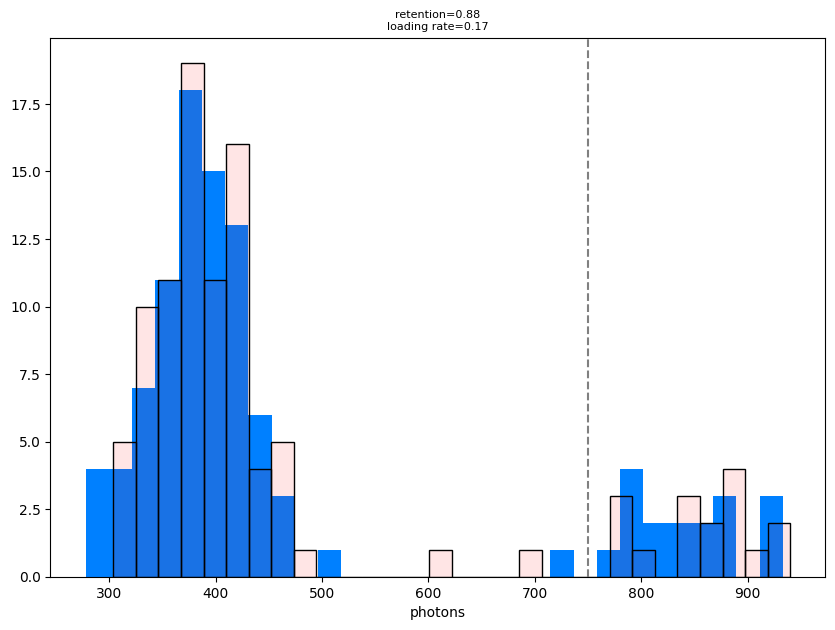

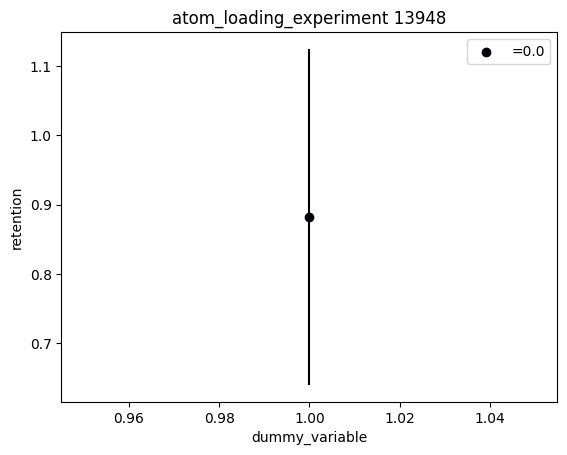

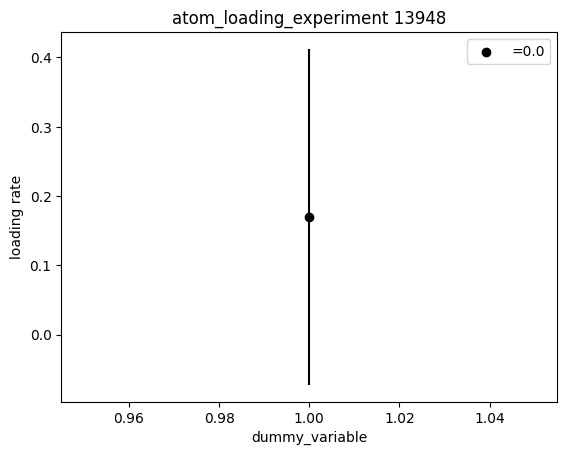

In [19]:
showhist = True
showloading = True

i = 1 # 100% retention, 10% loading
i = 2 # same parameters, but 5% loading
i = 6 #

f = h5py.File(os.path.join(results, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 50000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    if nrows*ncols > 1:
        for i, ax in enumerate(axes.flat):
            shot1 = photocounts[i*measurements:(i+1)*measurements]
            shot2 = photocounts2[i*measurements:(i+1)*measurements]
            ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
            ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
            ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
    else:
        i = 0
        ax = axes
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
    ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

In [13]:
AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT, set_point_PD1_AOM_A1, set_point_PD2_AOM_A2, set_point_PD3_AOM_A3,set_point_PD4_AOM_A4,set_point_PD5_AOM_A5,set_point_PD6_AOM_A6

(7.325986962125662,
 7.676280355540844,
 0.565744390077074,
 -0.07524905448792887,
 0.07113875458170105,
 0.05188396460864183,
 0.05571650672282959,
 0.08777515996362999,
 0.04586694854084926,
 0.04159163077155052)

## 2024.05.17
analyzing overnight stability of the FORT background level

In [98]:
fnames = get_files_by_criteria(date_filters=["2024-05-16"], # only find files from these date directories
                               name_filters=["ExperimentCycler"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 18

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        if 'GeneralVariableScan' in fnames:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        else:
            print(f"file {i} ({f})")

found 6 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-16\12\000013777-ExperimentCycler.h5)
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-16\12\000013778-ExperimentCycler.h5)
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-16\12\000013778-ExperimentCycler_atom_loading.h5)
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-16\18\000013828-ExperimentCycler.h5)
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-16\18\000013833-ExperimentCycler.h5)
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-16\18\000013833-ExperimentCycler_atom_loading.h5)


In [94]:
fnames[i], os.path.join(results, fnames[i])

('C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-05-16\\18\\13833_experiment_cycler_atom_loading.h5',
 'C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\2024-05-16\\18\\13833_experiment_cycler_atom_loading.h5')

In [102]:
len(photocounts), iterations

(41306, 1)

In [ ]:
showhist = True
showloading = True

i = 4 # experiment cycler overnight, > 14 hours of data. note: file is written all at once when experiment deleted

f = h5py.File(fnames[i])
# rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 32000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

(array([27., 31., 21.,  1.,  3.,  4.,  9.,  2.,  1.,  1.]),
 array([303. , 354.1, 405.2, 456.3, 507.4, 558.5, 609.6, 660.7, 711.8,
        762.9, 814. ]),
 <BarContainer object of 10 artists>)

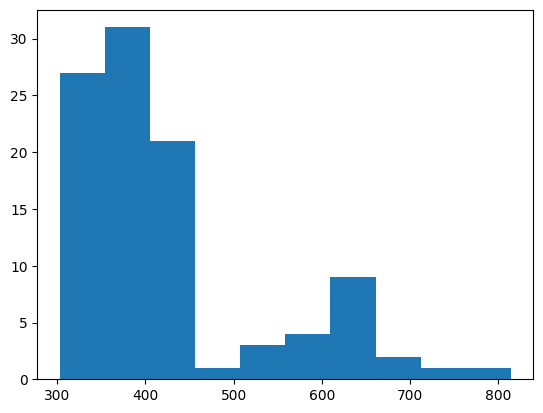

In [118]:
plt.hist(photocounts[0:measurements])

In [119]:
t_SPCM_first_shot

0.015

In [127]:
iterations, n_measurements

(413, 100)

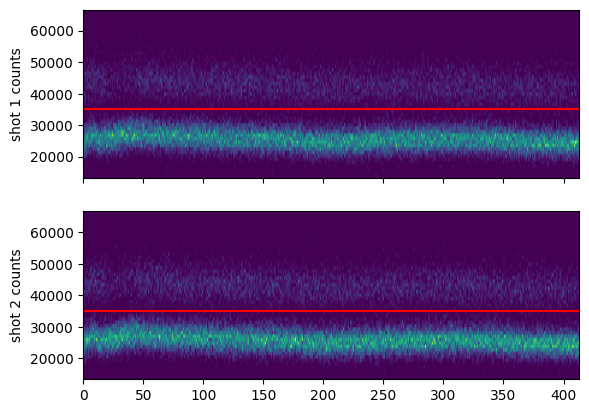

In [130]:
first_shot_hists = np.array(
    [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

second_shot_hists = np.array(
    [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

cutoff1 = cutoff2 = 35000

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes

cax=ax.imshow(first_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.axhline(cutoff1,color='red')
ax.set_aspect('auto')
cax2=ax2.imshow(second_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax2.set_ylabel("shot 2 counts")
ax2.axhline(cutoff2,color='red')
ax2.set_aspect('auto')
# fig.colorbar(cax2)



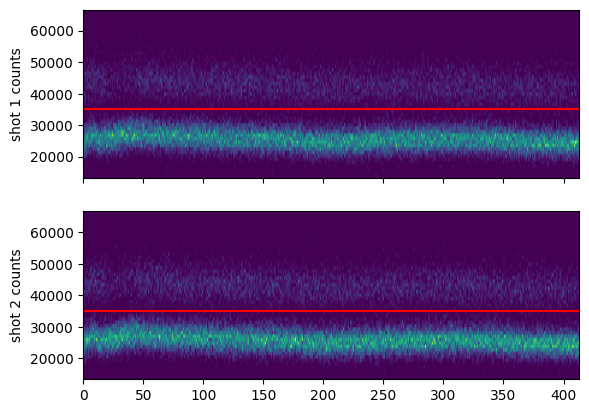

In [130]:
first_shot_hists = np.array(
    [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

second_shot_hists = np.array(
    [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

cutoff1 = cutoff2 = 35000

fig,axes = plt.subplots(nrows=2,sharex=True)
ax,ax2 = axes

cax=ax.imshow(first_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.axhline(cutoff1,color='red')
ax.set_aspect('auto')
cax2=ax2.imshow(second_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax2.set_ylabel("shot 2 counts")
ax2.axhline(cutoff2,color='red')
ax2.set_aspect('auto')
# fig.colorbar(cax2)

Text(0.5, 0, 'occurrences')

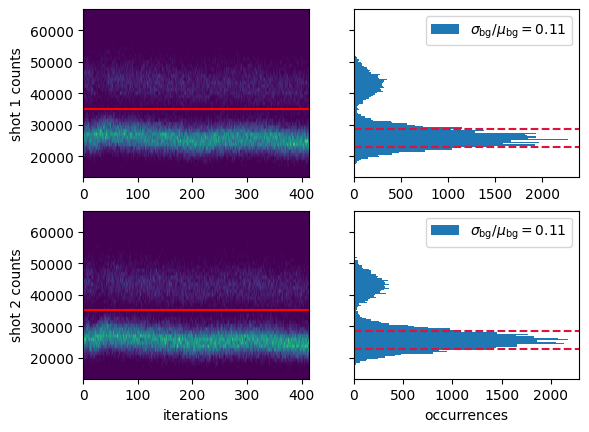

In [167]:
first_shot_hists = np.array(
    [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

second_shot_hists = np.array(
    [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                              for i in range(iterations)])

cutoff1 = cutoff2 = 35000

fig,axes = plt.subplots(nrows=2,ncols=2,sharey=True)
ax,ax2,ax3,ax4 = axes.flat

cax=ax.imshow(first_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax.set_ylabel("shot 1 counts")
ax.axhline(cutoff1,color='red')
ax.set_aspect('auto')
std1 = np.std(photocounts[photocounts < cutoff1*t_SPCM_first_shot]/t_SPCM_first_shot)
mean1 = np.mean(photocounts[photocounts < cutoff1*t_SPCM_first_shot]/t_SPCM_first_shot)
ax2.axhline(mean1+std1,color='crimson',linestyle='--')
ax2.axhline(mean1-std1,color='crimson',linestyle='--')
ax2.hist(photocounts/t_SPCM_first_shot, bins=100, orientation='horizontal', label=r'$\sigma_{\rm{bg}}/\mu_{\rm{bg}}=$'+f'{std1/mean1:.2f}')
ax2.legend()

cax3=ax3.imshow(second_shot_hists.transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
ax3.set_ylabel("shot 2 counts")
ax3.axhline(cutoff2,color='red')
ax3.set_aspect('auto')
ax3.set_xlabel("iterations")
std2 = np.std(photocounts2[photocounts2 < cutoff2*t_SPCM_second_shot]/t_SPCM_second_shot)
mean2 = np.mean(photocounts2[photocounts2 < cutoff2*t_SPCM_second_shot]/t_SPCM_second_shot)
ax4.axhline(mean2+std2,color='crimson',linestyle='--')
ax4.axhline(mean2-std2,color='crimson',linestyle='--')
ax4.hist(photocounts2/t_SPCM_second_shot, bins=100, orientation='horizontal', label=r'$\sigma_{\rm{bg}}/\mu_{\rm{bg}}=$'+f'{std2/mean2:.2f}')
ax4.legend()

ax4.set_xlabel("occurrences")
# fig.colorbar(cax2)

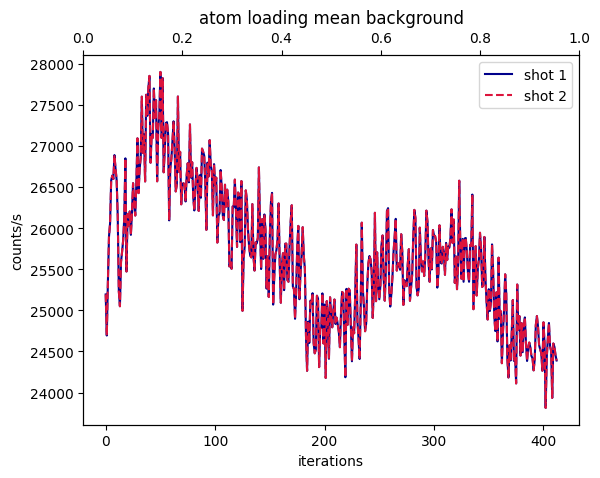

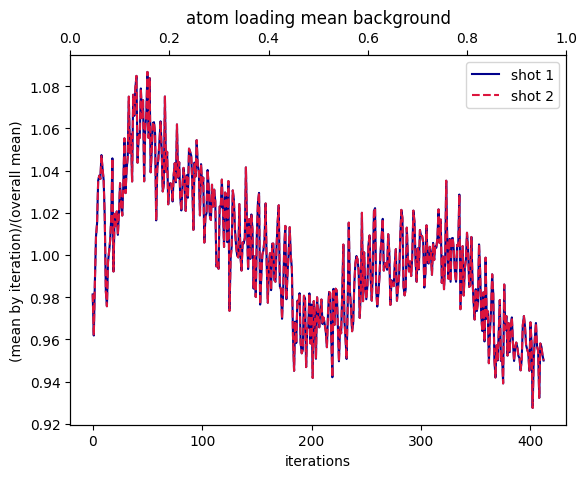

In [184]:
# plot the mean background counts/s
mean1_by_iteration = [np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1*t_SPCM_first_shot]/t_SPCM_first_shot) 
                              for i in range(iterations)]
mean2_by_iteration = [np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1*t_SPCM_first_shot]/t_SPCM_first_shot) 
                              for i in range(iterations)]

fig,ax = plt.subplots()
ax2 = ax.twiny()
ax.plot(mean1_by_iteration,color='darkblue',label='shot 1')
ax.plot(mean2_by_iteration,color='crimson',ls='--',label='shot 2')
ax.set_title("atom loading mean background")
ax.set_ylabel("counts/s")
ax.set_xlabel("iterations")
ax.legend()
plt.show()

fig,ax = plt.subplots()
ax2 = ax.twiny()
ax.plot(mean1_by_iteration/np.mean(mean1_by_iteration),color='darkblue',label='shot 1')
ax.plot(mean2_by_iteration/np.mean(mean2_by_iteration),color='crimson',ls='--',label='shot 2')
ax.set_title("atom loading mean background")
ax.set_ylabel("(mean by iteration)/(overall mean)")
ax.set_xlabel("iterations")
ax.legend()

In [185]:
0.06*4000

240.0

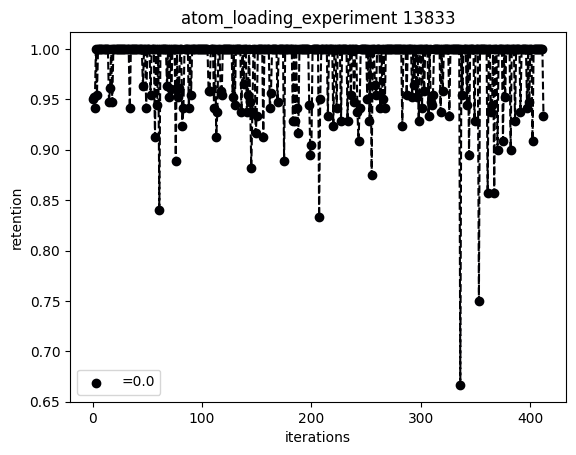

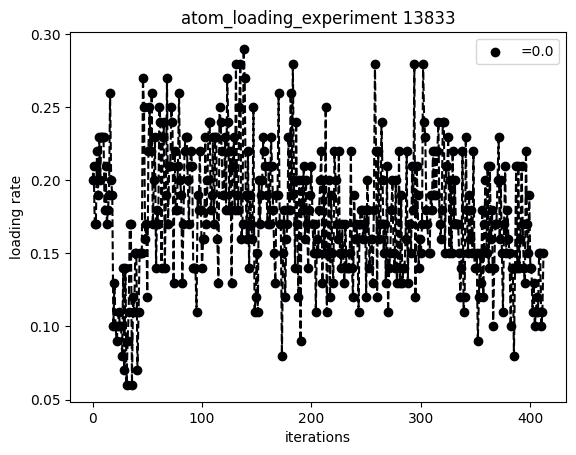

In [137]:
cutoff1 = cutoff2 = 35000*t_SPCM_first_shot

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

xsteps = range(iterations)

# plot retention curve
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(xsteps, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(xsteps, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    # plt.errorbar(xsteps, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel("iterations")
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()



if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(xsteps, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(xsteps, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        # plt.errorbar(xsteps, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel("iterations")
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

In [139]:
np.mean(retention),np.mean(loading)

(0.9816851688164945, 0.17503631961259078)

In [ ]:
for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    if nrows*ncols > 1:
        for i, ax in enumerate(axes.flat):
            shot1 = photocounts[i*measurements:(i+1)*measurements]
            shot2 = photocounts2[i*measurements:(i+1)*measurements]
            ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
            ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
            ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
    else:
        i = 0
        ax = axes
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
    ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

In [110]:
showhist = True
showloading = True

i = 4 # experiment cycler overnight, > 14 hours of data. note: file is written all at once when experiment deleted

f = h5py.File(os.path.join(results, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
# iterations = len(scan_sequence1)*len(scan_sequence2)
iterations = int(len(photocounts)/n_measurements)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

# assert len(photocounts) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
Pumping light off? False


In [111]:
iterations

413

In [117]:
cutoff1=cutoff2 = 32000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

# ncols = len(scan_sequence2)
# nrows = len(scan_sequence1)
ncols = 1
nrows = iterations

# dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
# if scan_is_2D:
#     dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

# shape = (len(scan_sequence2),len(scan_sequence1))
shape = (1, iterations)
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    for i, ax in enumerate(axes.flat):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

KeyboardInterrupt: 

## 2024.05.15
previously I was stabilizing the value used for the MOT and lowering it during the rest of the experiment, now I've flipped that.

In [77]:
fnames = get_files_by_criteria(date_filters=["2024-05-15"], # only find files from these date directories
                               name_filters=["atom_loading", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 18

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 6 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-15\08\000013729-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5) scanned over dummy_variable
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-15\10\000013740-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5) scanned over dummy_variable
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-15\10\000013743-GeneralVariableScan_atom_loading_scan_over_t_UV_pulse.h5) scanned over t_UV_pulse
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-15\12\000013750-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5) scanned over dummy_variable
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-15\12\000013753-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5) scanned over dummy_variable
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-15\14\000013759-Gene

experiment: atom_loading_experiment
Pumping light off? False


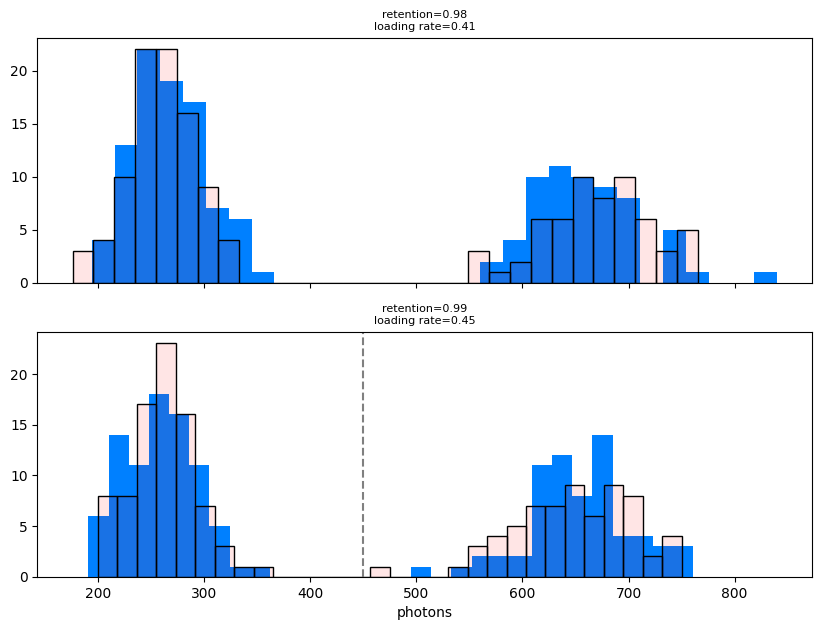

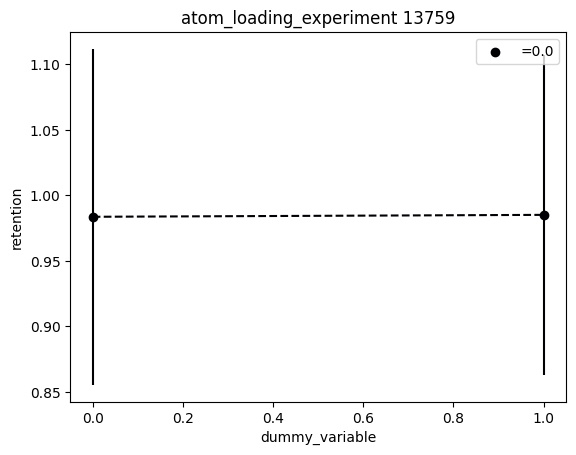

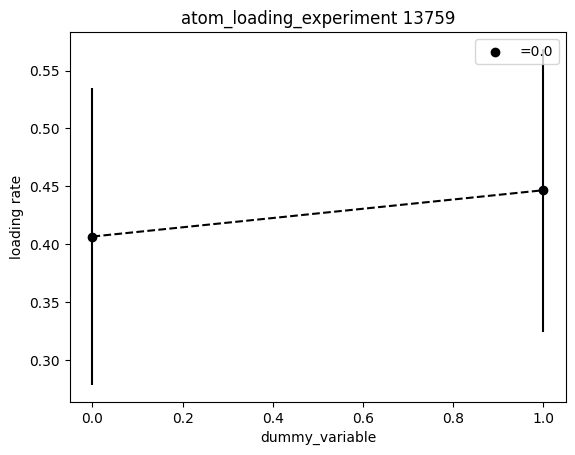

In [79]:
showhist = True
showloading = True

i = 1 # 100% retention and 20% loading. this is with the values found by MLOOP
i = 2 # scan over UV pulse time, showing a marginal increase in loading rate with more UV
i = 5 # we're back! I ran MLOOP again after realizing the cut-off wasn't good. the optimizer was getting fooled by noise with an atom.

f = h5py.File(os.path.join(results, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 30000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    if nrows*ncols > 1:
        for i, ax in enumerate(axes.flat):
            shot1 = photocounts[i*measurements:(i+1)*measurements]
            shot2 = photocounts2[i*measurements:(i+1)*measurements]
            ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
            ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
            ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
    else:
        i = 0
        ax = axes
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
    ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

## 2024.05.10

### trying to get atom loading back.
there was a weird event this morning that seems to have either changed the magnetic field at the atoms or more likely changed a voltage level somewhere by at a least a 100 mV. The atom loading went away completely after experiment 13241.

In [21]:
fnames = get_files_by_criteria(date_filters=["2024-05-10"], # only find files from these date directories
                               name_filters=["AtomLoadingOptimizerMLOOP"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 18

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 2 files
oops... something wrong with C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-10\13\000013291-AtomLoadingOptimizerMLOOP.h5
oops... something wrong with C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-10\14\000013301-AtomLoadingOptimizerMLOOP.h5


In [27]:
file1_dict = {}
file1 = "2024-05-10\\13\\000013291-AtomLoadingOptimizerMLOOP.h5"
f = h5py.File(os.path.join(results, file1))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
rid1 = f['rid'][()]
print(rid1)

13291


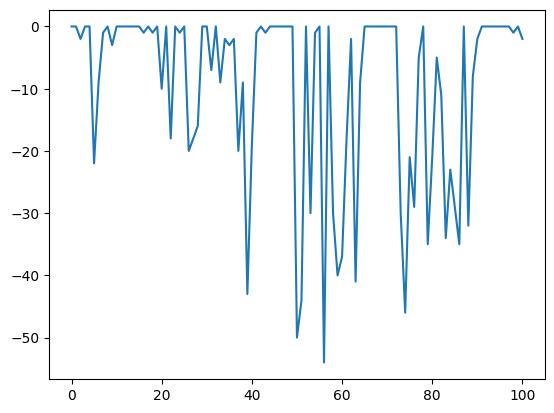

In [29]:
"""
there was atom loading found but I haven't been able to reproduce this
"""
plt.plot(cost)

In [31]:
file1_dict = {}
file1 = "2024-05-10\\13\\000013292-GeneralVariableScan.h5"
f = h5py.File(os.path.join(results, file1))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
rid1 = f['rid'][()]
print(rid1)

13292


In [41]:
AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

(8.005520751953124, 8.263903076171875, 0.6528334960937501, 0.03624755859374999)

In [40]:
set_point_PD1_AOM_A1, set_point_PD2_AOM_A2, set_point_PD3_AOM_A3, set_point_PD4_AOM_A4, set_point_PD5_AOM_A5, set_point_PD6_AOM_A6

(0.064,
 0.049600000000000005,
 0.0576,
 0.0792,
 0.037652591489170106,
 0.062400000000000004)

In [46]:
file1_dict = {}
file1 = "2024-05-08\\20\\000013181-GeneralVariableScan.h5"
f = h5py.File(os.path.join(results, file1))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
rid1 = f['rid'][()]
print(rid1)

13181


In [47]:
AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

(7.503, 7.957, 0.536, -0.105)

In [49]:
set_point_PD1_AOM_A1, set_point_PD2_AOM_A2, set_point_PD3_AOM_A3, set_point_PD4_AOM_A4, set_point_PD5_AOM_A5, set_point_PD6_AOM_A6, set_point_FORT_MM

(0.08, 0.062, 0.072, 0.099, 0.04706573936146263, 0.078, 0.3)

In [54]:
file1_dict = {}
file1 = "2024-05-10\\17\\000013324-AtomLoadingOptimizerMLOOP.h5"
f = h5py.File(os.path.join(results, file1))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
rid1 = f['rid'][()]
print(rid1)

13324


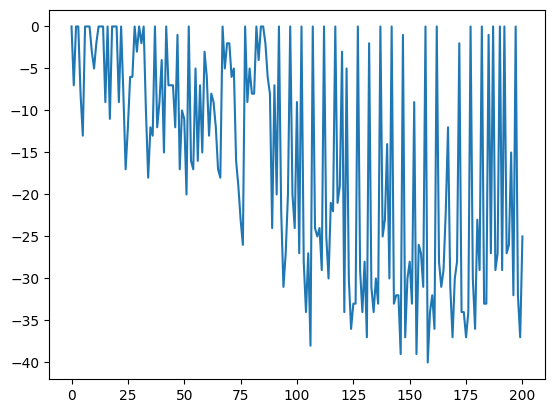

In [55]:
"""
there was atom loading found but I haven't been able to reproduce this
"""
plt.plot(cost)

In [46]:
file1_dict = {}
file1 = "2024-05-08\\20\\000013181-GeneralVariableScan.h5"
f = h5py.File(os.path.join(results, file1))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
rid1 = f['rid'][()]
print(rid1)

13181


In [47]:
AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

(7.503, 7.957, 0.536, -0.105)

In [49]:
set_point_PD1_AOM_A1, set_point_PD2_AOM_A2, set_point_PD3_AOM_A3, set_point_PD4_AOM_A4, set_point_PD5_AOM_A5, set_point_PD6_AOM_A6, set_point_FORT_MM

(0.08, 0.062, 0.072, 0.099, 0.04706573936146263, 0.078, 0.3)

right before I ran the optimizer, I ran SamplerMOTCoil... to get some initial atom loading manually

In [57]:
file1_dict = {}
file1 = "2024-05-10\\16\\000013321-SamplerMOTCoilAndBeamBalanceTune.h5"
f = h5py.File(os.path.join(results, file1))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
rid1 = f['rid'][()]
print(rid1)

13321


In [58]:
AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

(7.658792236328125,
 7.915648681640626,
 0.574909912109375,
 -0.041828613281249996)

In [60]:
set_point_PD1_AOM_A1, set_point_PD2_AOM_A2, set_point_PD3_AOM_A3, set_point_PD4_AOM_A4, set_point_PD5_AOM_A5, set_point_PD6_AOM_A6, set_point_FORT_MM

(0.064, 0.05, 0.058, 0.079, 0.038, 0.062, 0.3)

right before I ran the optimizer, I ran SamplerMOTCoil... to get some initial atom loading manually

In [66]:
file1_dict = {}
file1 = "2024-05-10\\17\\000013324-AtomLoadingOptimizerMLOOP.h5"
f = h5py.File(os.path.join(results, file1))
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
rid1 = f['rid'][()]
print(rid1)

13324


In [67]:
AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

(7.758792236328125, 7.815648681640626, 0.5567796064294301, 0.05817138671875001)

In [68]:
set_point_PD1_AOM_A1, set_point_PD2_AOM_A2, set_point_PD3_AOM_A3, set_point_PD4_AOM_A4, set_point_PD5_AOM_A5, set_point_PD6_AOM_A6, set_point_FORT_MM

(0.0704,
 0.05303628319087981,
 0.059513757845025016,
 0.0869,
 0.040157771841664545,
 0.049600000000000005,
 0.3)

### changing FORT feedback so the science phase/readout level is stabilized
previously I was stabilizing the value used for the MOT and lowering it during the rest of the experiment, now I've flipped that.

In [51]:
fnames = get_files_by_criteria(date_filters=["2024-05-10"], # only find files from these date directories
                               name_filters=["atom_loading", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 18

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 7 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-10\07\000013233-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5) scanned over dummy_variable
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-10\07\000013235-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5) scanned over dummy_variable
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-10\07\000013238-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5) scanned over dummy_variable
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-10\07\000013241-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5) scanned over dummy_variable
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-10\08\000013263-GeneralVariableScan_atom_loading_scan_over_dummy_variable.h5) scanned over dummy_variable
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-10\08\000013

experiment: atom_loading_experiment
Pumping light off? False


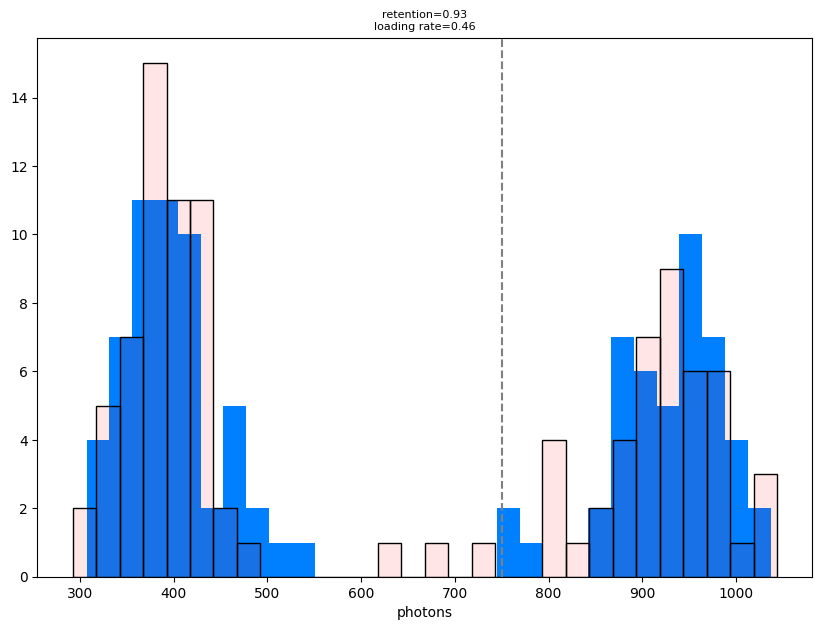

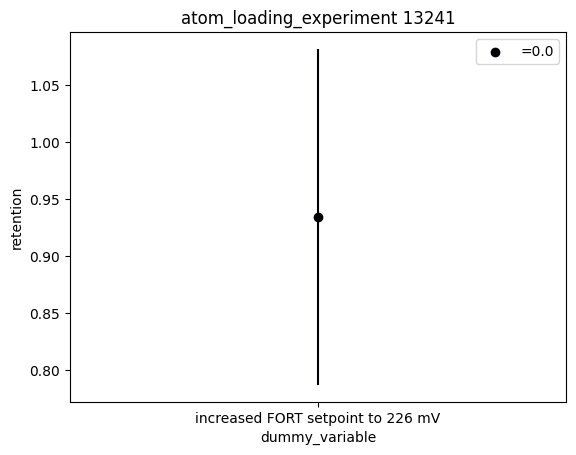

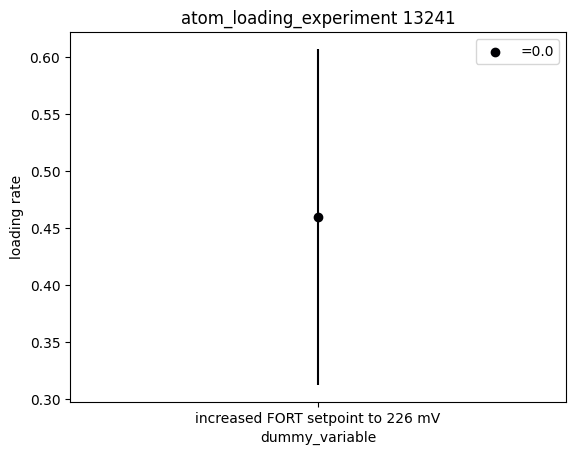

NameError: name 'fidx' is not defined

In [52]:
showhist = True
showloading = True

i = 3 # 100% retention and 40% loading. right after this was run I lost loading. this was apparently a lab issue and the coil values are different now

f = h5py.File(os.path.join(results, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 50000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    if nrows*ncols > 1:
        for i, ax in enumerate(axes.flat):
            shot1 = photocounts[i*measurements:(i+1)*measurements]
            shot2 = photocounts2[i*measurements:(i+1)*measurements]
            ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
            ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
            ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
    else:
        i = 0
        ax = axes
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
    ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

if fidx == 0:
    depump_retention = retention_array
    depump_error = errs
    t_pts_depump = scan_sequence1
elif fidx == 1:
    pump_retention = retention_array
    t_pts_pump = scan_sequence1
    pump_error = errs

## 2024.04.17

### Scanning PGC parameters
I added a dedicated FORT power level during the the PGC phase after the MOT, and am trying to optimize that, and subsequently re-optimize the other PGC parameters.

In [2]:
fnames = get_files_by_criteria(date_filters=["2024-04-17"], # only find files from these date directories
                               name_filters=["atom_loading", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 3 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-17\08\000012050-GeneralVariableScan_atom_loading.h5) scanned over t_FORT_drop
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-17\08\000012051-GeneralVariableScan_atom_loading.h5) scanned over p_FORT_PGC
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-17\08\000012052-GeneralVariableScan_atom_loading.h5) scanned over p_FORT_PGC


In [151]:
fname = fnames[1] # retention possibly optimal around p_FORT_PGC = 0.8
fname = fnames[2] # exact same experiment run again to check reproducibility. 0.8 is probably the best for loading (higher doesn't hurt, but lower is worse), but the retention isn't sensitive to this beyond 0.7


f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])


iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
p_FORT_PGC [0.5 0.6 0.7 0.8 0.9 1. ]
 [0.]


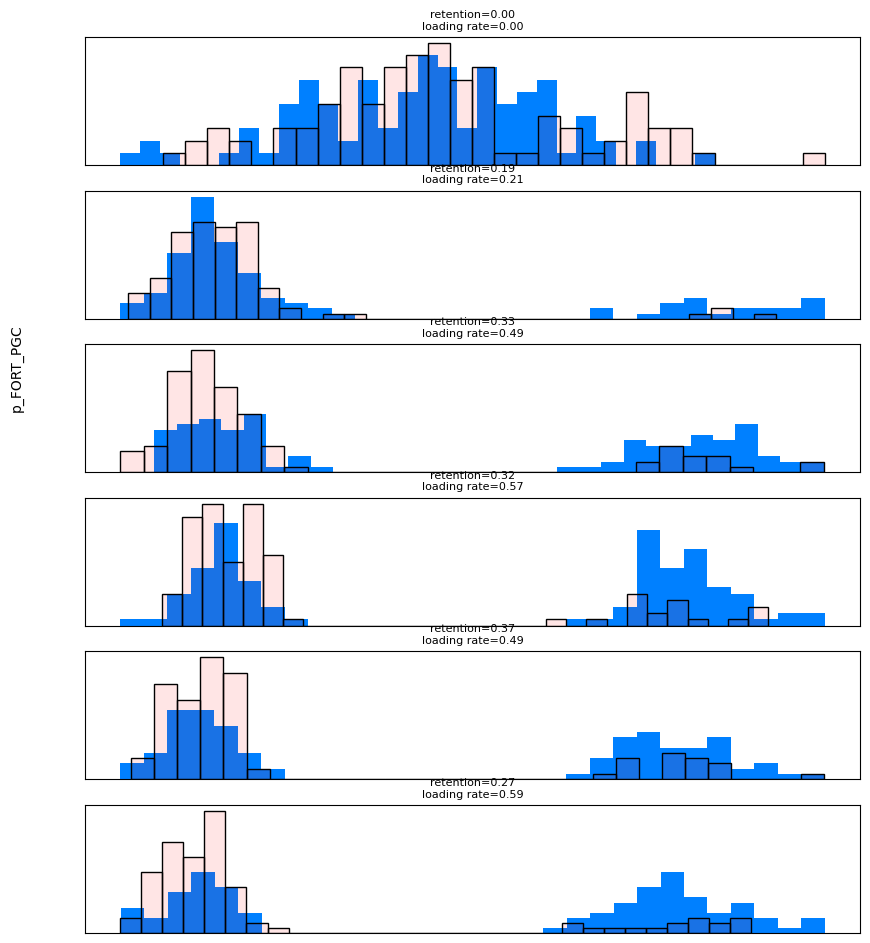

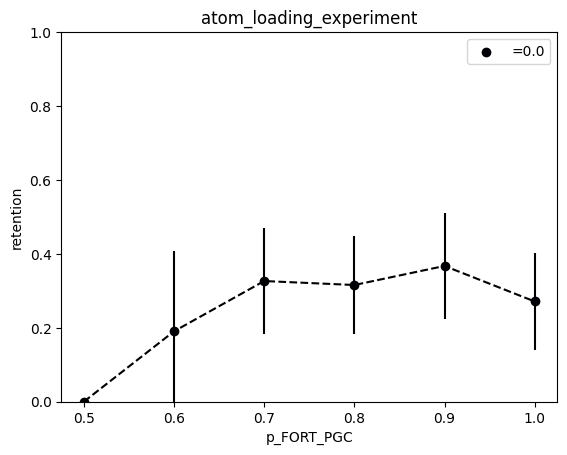

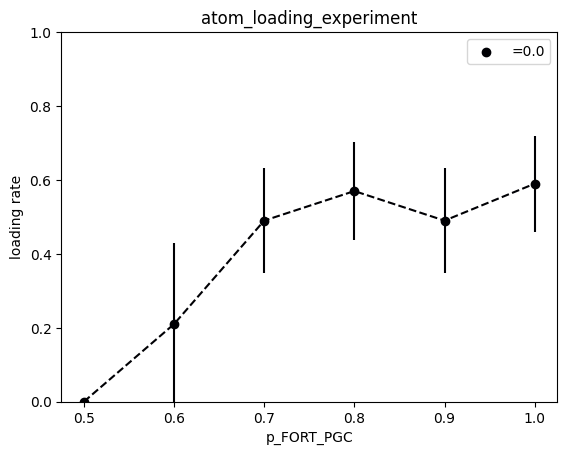

In [152]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## 2024-04-16

In [146]:
fnames = get_files_by_criteria(date_filters=["2024-04-16"], # only find files from these date directories
                               name_filters=["atom_loading", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        # print(f"file {i} ({f[72:]}) scanned over "+scan_str)
        print(f"file {i} ({f}) scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 12 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-16\10\000012021-GeneralVariableScan_atom_loading.h5) scanned over t_FORT_drop
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-16\10\000012022-GeneralVariableScan_atom_loading.h5) scanned over t_FORT_drop
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-16\10\000012023-GeneralVariableScan_atom_loading.h5) scanned over t_FORT_drop
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-16\12\000012025-GeneralVariableScan_atom_loading.h5) scanned over t_FORT_drop
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-16\14\000012030-GeneralVariableScan_atom_loading.h5) scanned over t_FORT_drop
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-04-16\14\000012031-GeneralVariableScan_atom_loading.h5) scanned over t_PGC_in_MOT
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-0

## Scanning PGC parameters
The PGC in the MOT seemed to neither helping nor heating, so I have put the PGC after the MOT dissipation in the MOT/FORT loading

In [127]:
fname = fnames[9] # possibly shows some cooling for 10 ms of PGC. f_cooling_DP_PGC = 120 MHz
# fname = fnames[10] # 10 ms of PGC. shows best cooling with f_cooling_DP_PGC = 120 MHz


f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
t_PGC_in_MOT [0.    0.001 0.002 0.005 0.01  0.02 ]
 [0.]


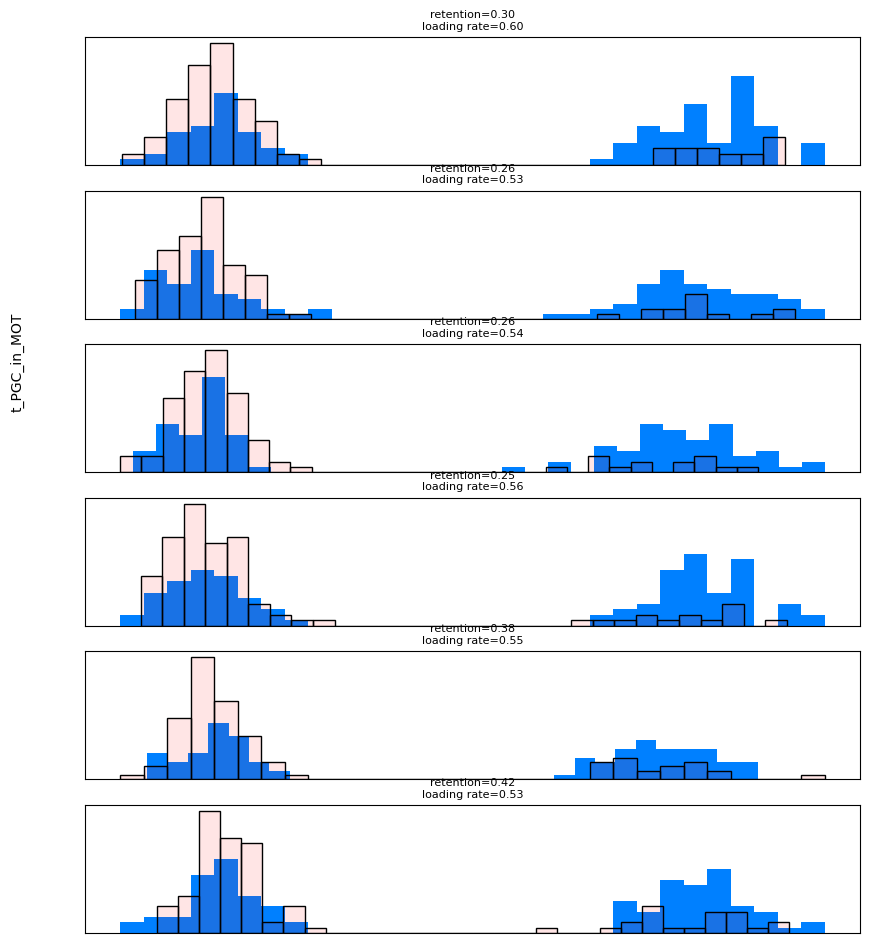

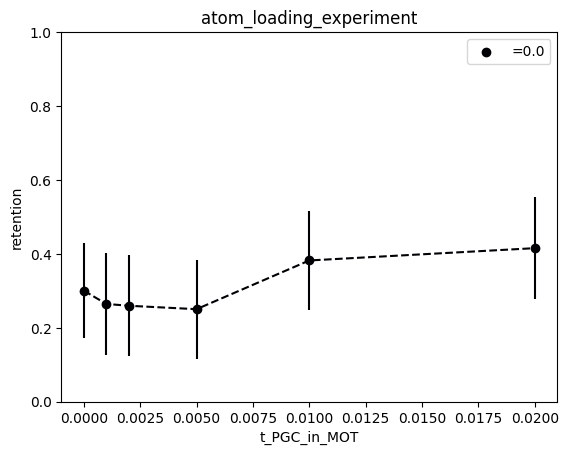

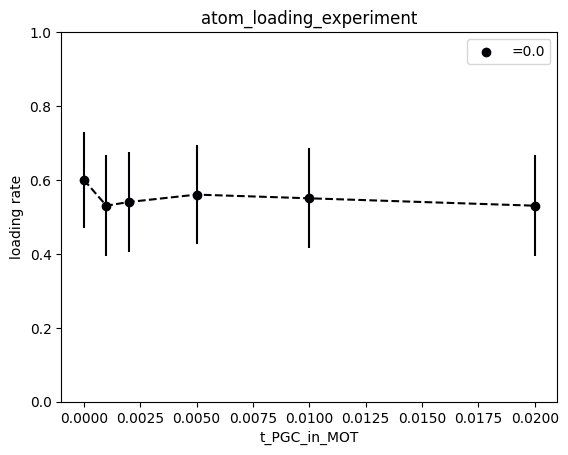

In [128]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## Retention with FORT dropping
This is with PGC for 30ms.

In [114]:
fname = fnames[7] # shows 100% retention :D

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
t_FORT_drop [0.0e+00 2.0e-06 5.0e-06 1.0e-05 1.5e-05]
 [0.]


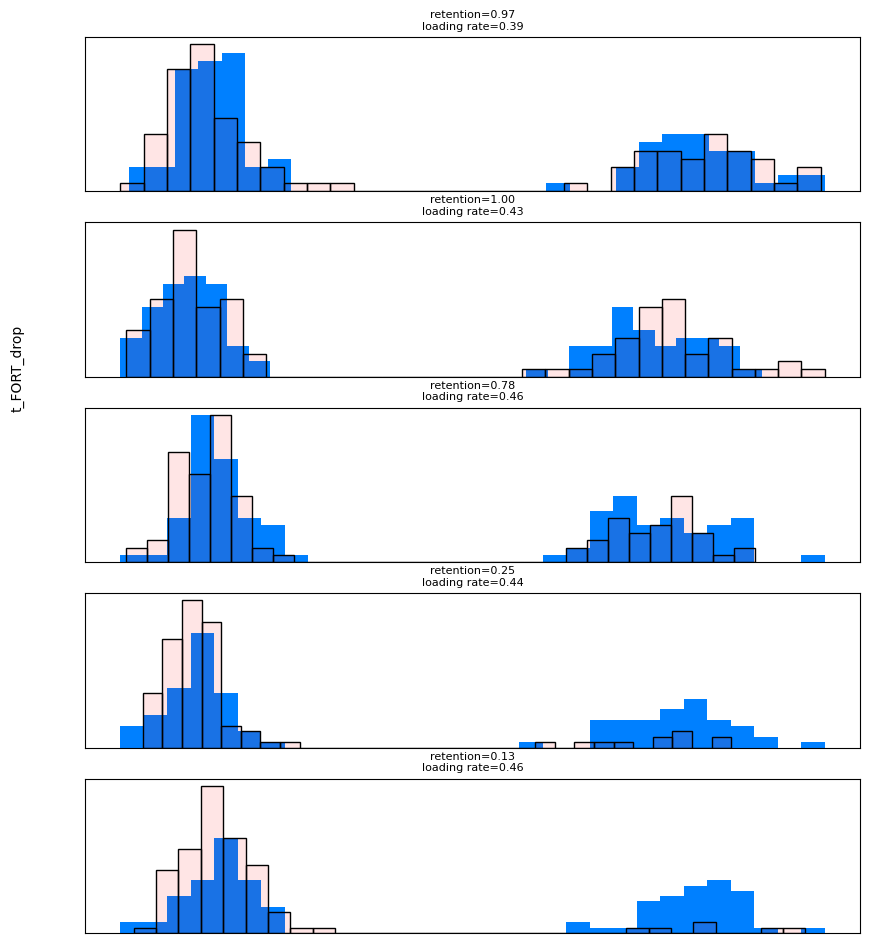

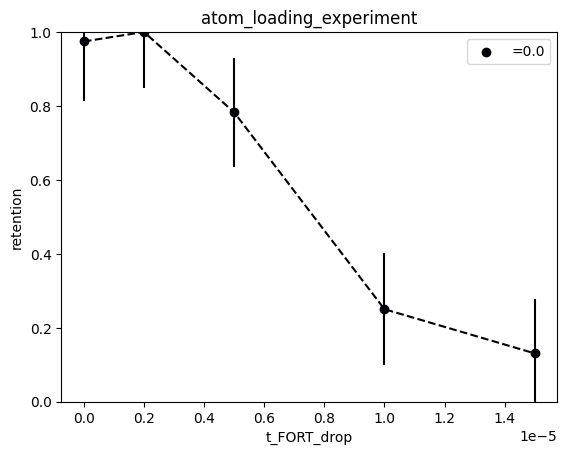

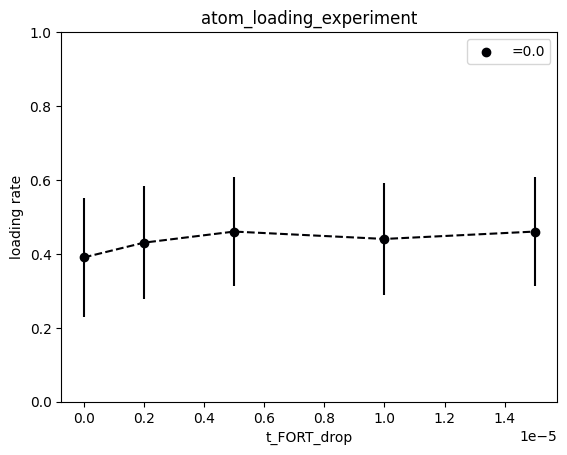

In [115]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## 2024.04.15

In [116]:
fnames = get_files_by_criteria(date_filters=["2024-04-15"], # only find files from these date directories
                               name_filters=["atom_loading", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    try:
        scan_str = str_from_h5(ds['scan_variable1_name'])
        if str_from_h5(ds['scan_variable2_name']) != '':
            scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
        print(f"file {i} scanned over "+scan_str)
    except:
        print(f"oops... something wrong with {f}")

found 25 files
file 0 scanned over t_SPCM_first_shot
file 1 scanned over t_MOT_loading
file 2 scanned over t_MOT_loading
file 3 scanned over FORT_on_at_MOT_start
file 4 scanned over FORT_on_at_MOT_start
file 5 scanned over t_FORT_loading
file 6 scanned over FORT_on_at_MOT_start
file 7 scanned over dummy_variable
file 8 scanned over dummy_variable
file 9 scanned over dummy_variable
file 10 scanned over FORT_on_at_MOT_start
file 11 scanned over t_MOT_loading
file 12 scanned over t_MOT_loading
file 13 scanned over t_UV_pulse
file 14 scanned over t_MOT_loading
file 15 scanned over t_MOT_loading
file 16 scanned over f_cooling_DP_MOT
file 17 scanned over set_point_FORT_MM
file 18 scanned over p_FORT_RO
file 19 scanned over p_FORT_RO
file 20 scanned over dummy_variable
file 21 scanned over t_SPCM_first_shot
file 22 scanned over t_SPCM_first_shot
file 23 scanned over t_FORT_drop
file 24 scanned over t_MOT_loading


## rescan t_MOT_loading to see if we can load any faster
since the PGC issue mentioned below was fixed and the loading rate is ~40%, let's see how quickly it drops off with shorter loading time

In [103]:
fname = fnames[24] # bad loading below 300 ms, but kind of inconclusive. retention varies a lot with low statistics, but it is still extra sensitive because of the FORT drop

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
t_MOT_loading [0.1 0.2 0.3 0.4 0.5]
 [0.]


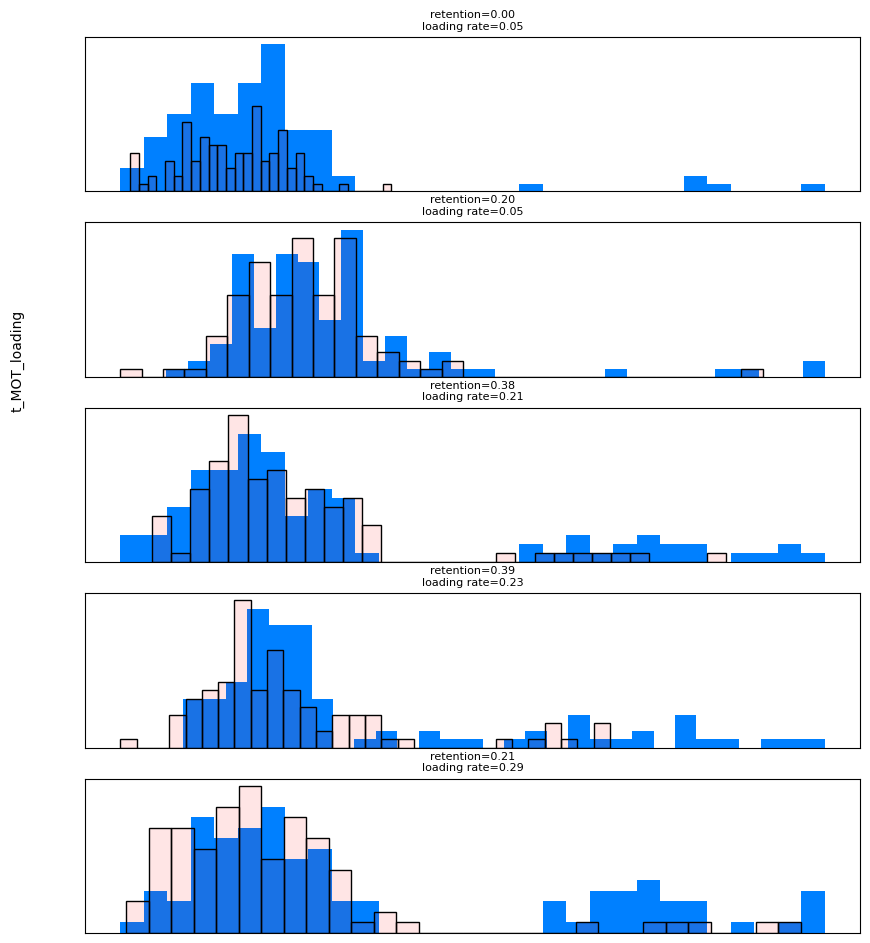

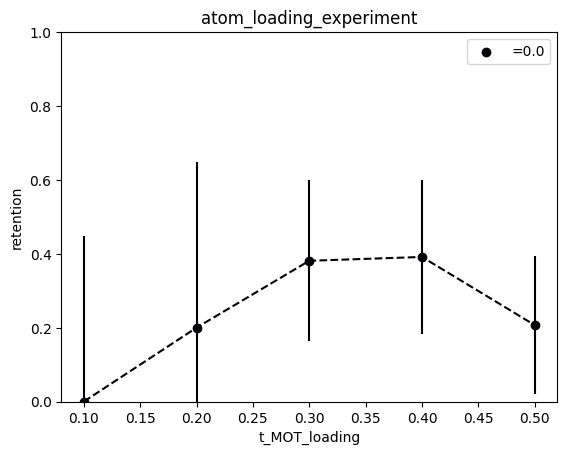

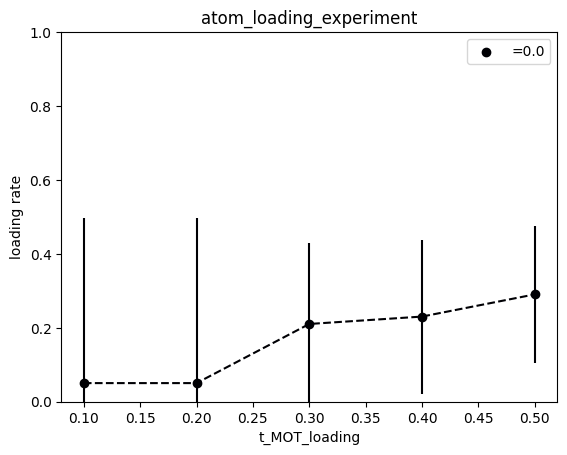

In [102]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## check retention with and without t_FORT_drop to verify that atom retention is still good with no drop.
This is a sanity check because the cell groups below have had a 10 us FORT drop. I also lowered the MOT loading time to 500 ms. It's possible it can go lower still now that the PGC coil setting is heating us.

In [117]:
fname = fnames[23] # shows 100% retention :D

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
t_FORT_drop [0.e+00 1.e-05]
 [0.]


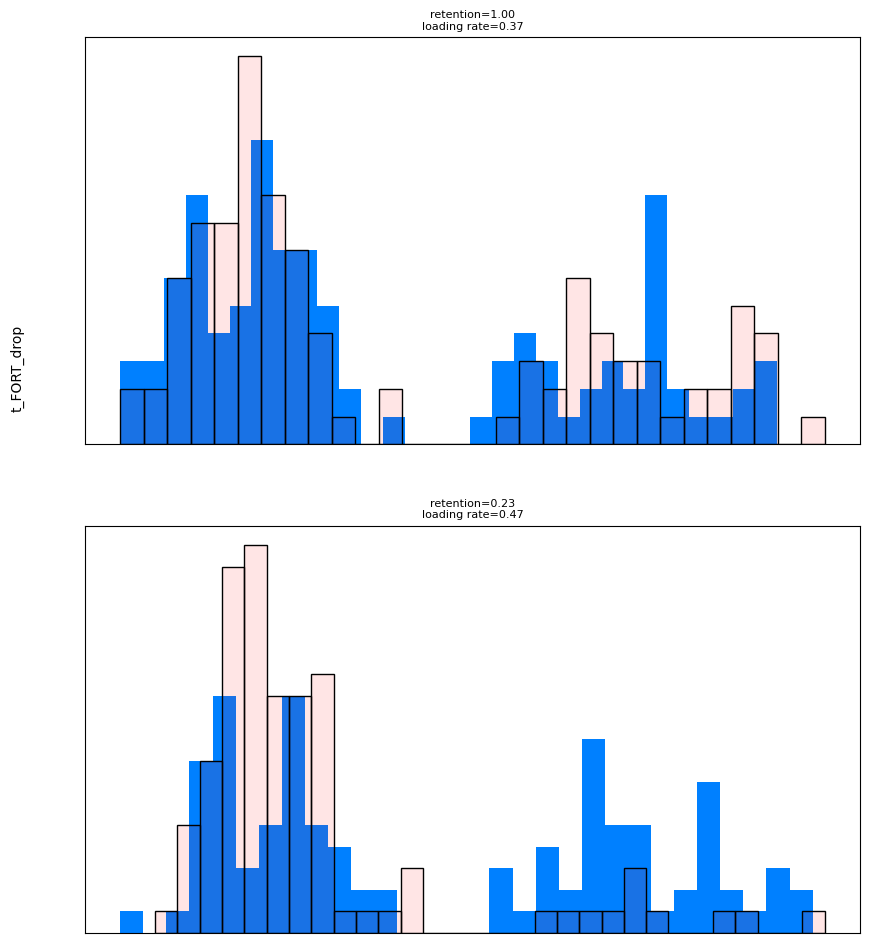

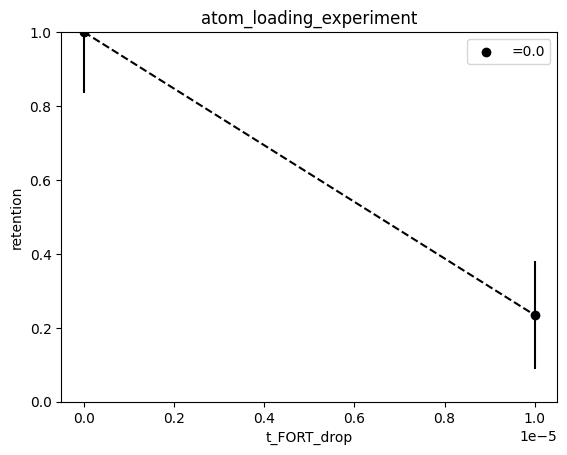

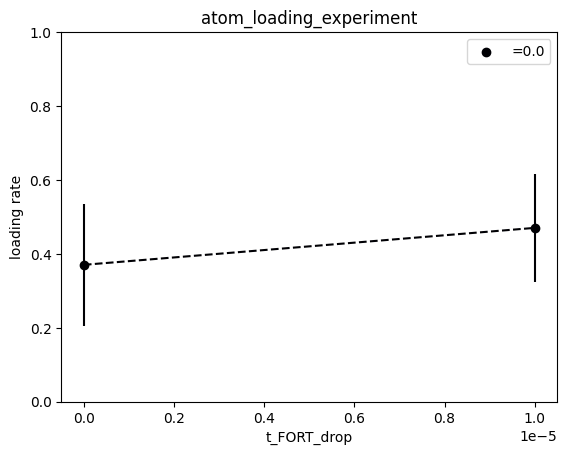

In [118]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## scan over readout time
with the loading improved (see the cell group below this one), it was clear that the readout time could be reduced

In [88]:
fname = fnames[21] # shows good histogram separation with even 5 ms readout
fname = fnames[22] # histogram separation is passable with 3 ms, but no signficant dependence of atom retention of the readout duration

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
t_SPCM_first_shot [0.001 0.002 0.003 0.004 0.005]
 [0.]


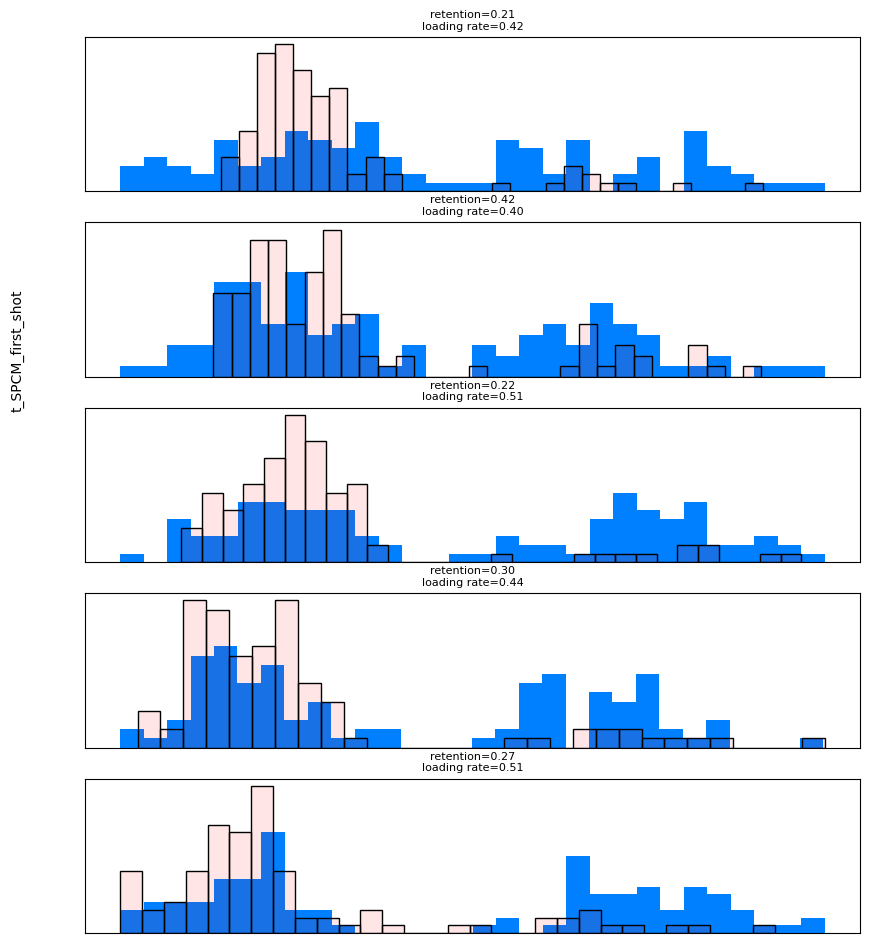

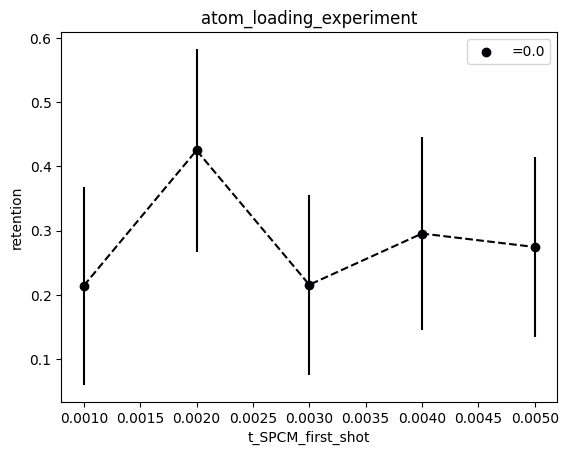

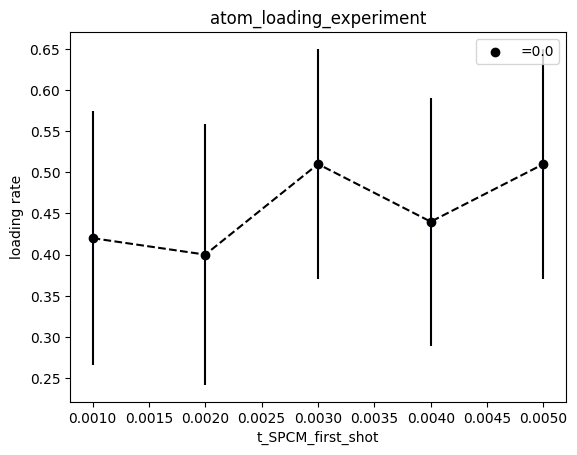

In [90]:
# caution: DON'T COPY THE CELL BELOW FOR OTHER VARIABLE SCANS, since the readout time t_SCPM_first_shot changes how we calculate the atom theshold for each step

showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]

    # THIS IS ONLY VALID IF WE ARE SCANNING THE FIRST READOUT TIME
    cutoff1 = single_atom_counts_per_s*scan_sequence1[i]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]/scan_sequence1[i]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]/t_SPCM_second_shot
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## sanity check - dummy variable scan. best histograms so far.
higher FORT during MOT, lower FORT during readout, found a bug in the code: toward the end of load_MOT_and_FORT, the coils were being set to the PGC values which are not optimized, even if the PGC phase is off. now this only happens inside the conditional for PGC.

In [80]:
fname = fnames[20]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
dummy_variable [0.7  0.85 1.  ]
 [0.]


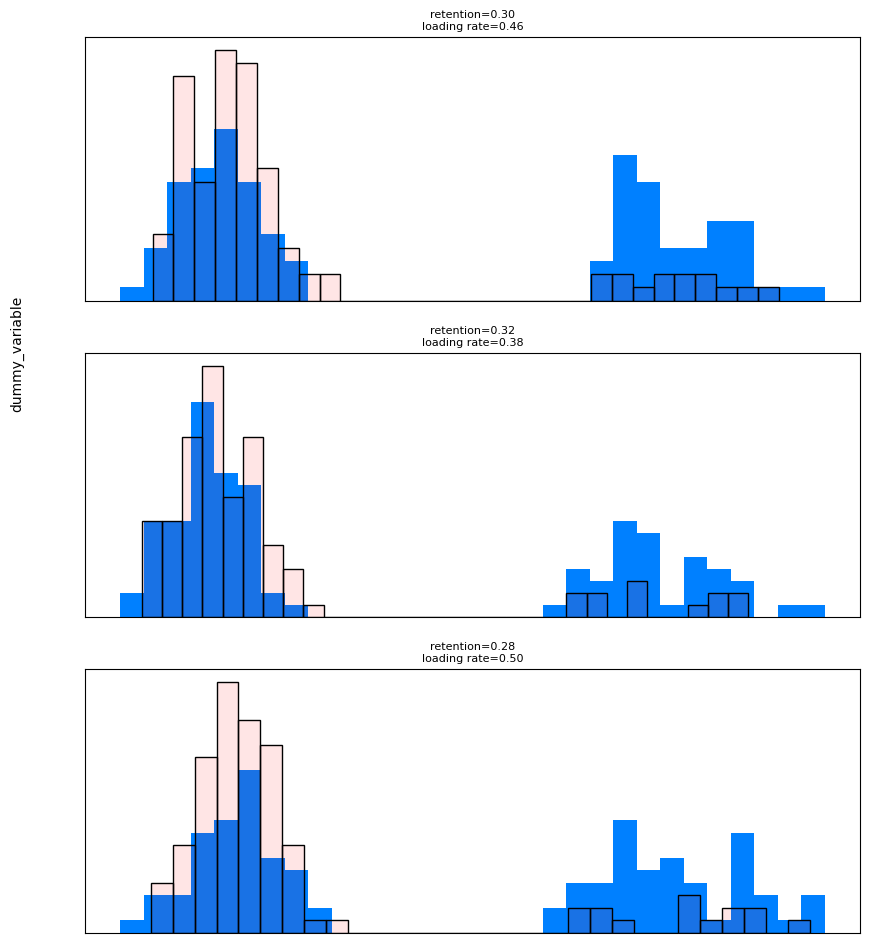

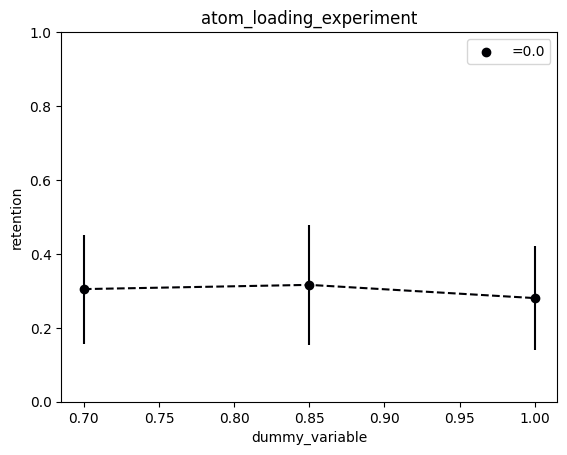

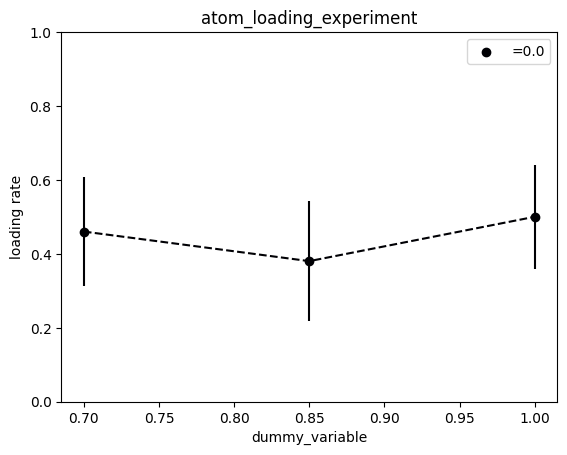

In [81]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## scan of FORT power during readout (p_FORT_RO)
I turned the FORT power during loading up to 0.3 (i.e. the value of set_point_FORT_MM), but am multiplying the power by p_FORT_RO after load_MOT_and_FORT. this is the standard way of adjusting the power during teh experiment after the feedback runs.

In [77]:
fname = fnames[18] # oops. this was not scanning the FORT RO power. this was scanning the cooling_DP power by accident, but the experiment reset it to the correct value immediately so it didn't have any effect
fname = fnames[19]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
p_FORT_RO [0.7 0.8 0.9 1. ]
 [0.]


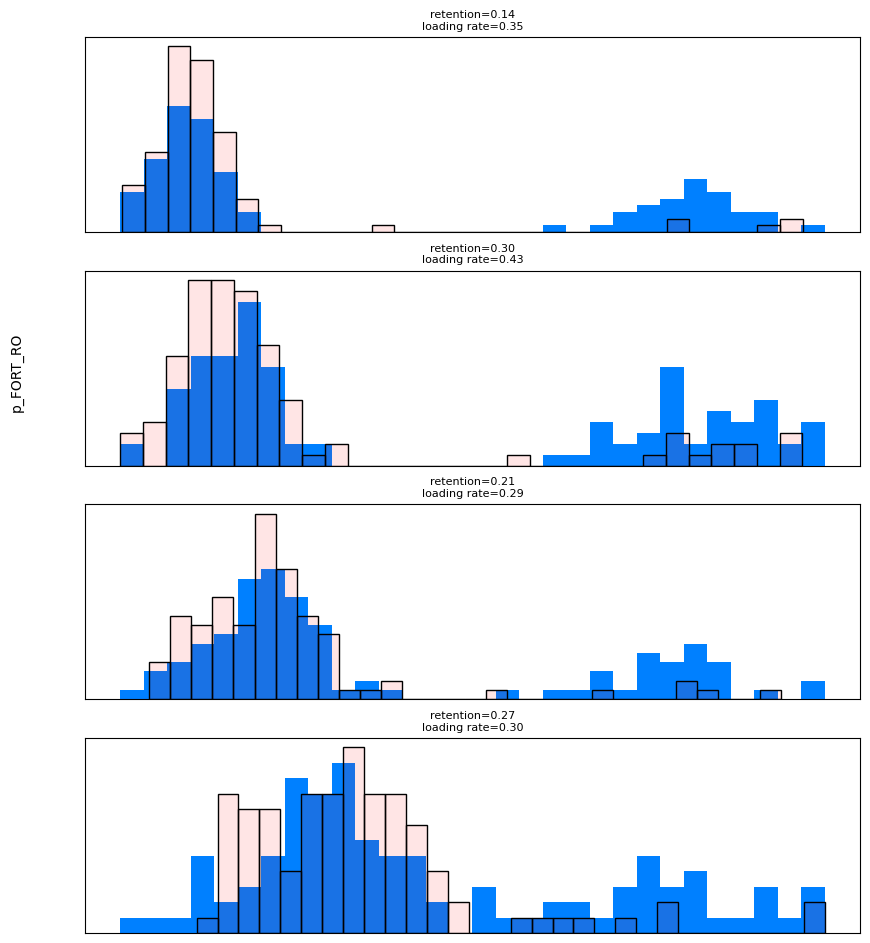

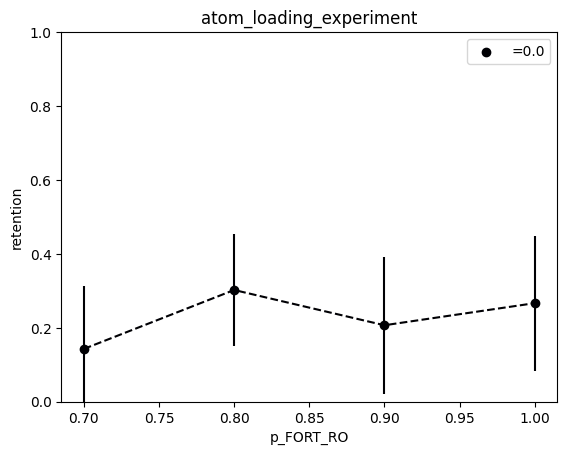

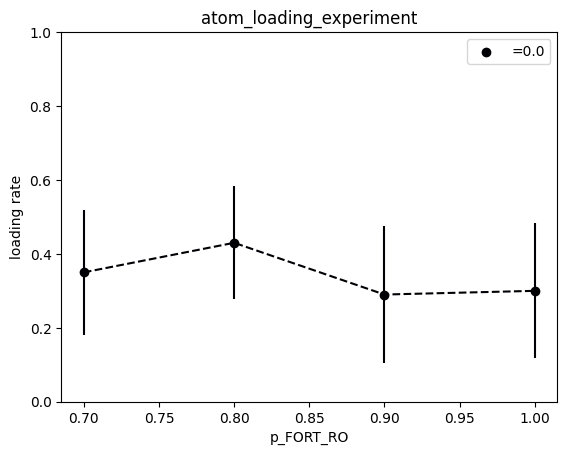

In [78]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## scan of FORT power (set_point_FORT_MM)

In [71]:
fname = fnames[17]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
set_point_FORT_MM [0.1        0.13333333 0.16666667 0.2        0.23333333 0.26666667
 0.3       ]
 [0.]


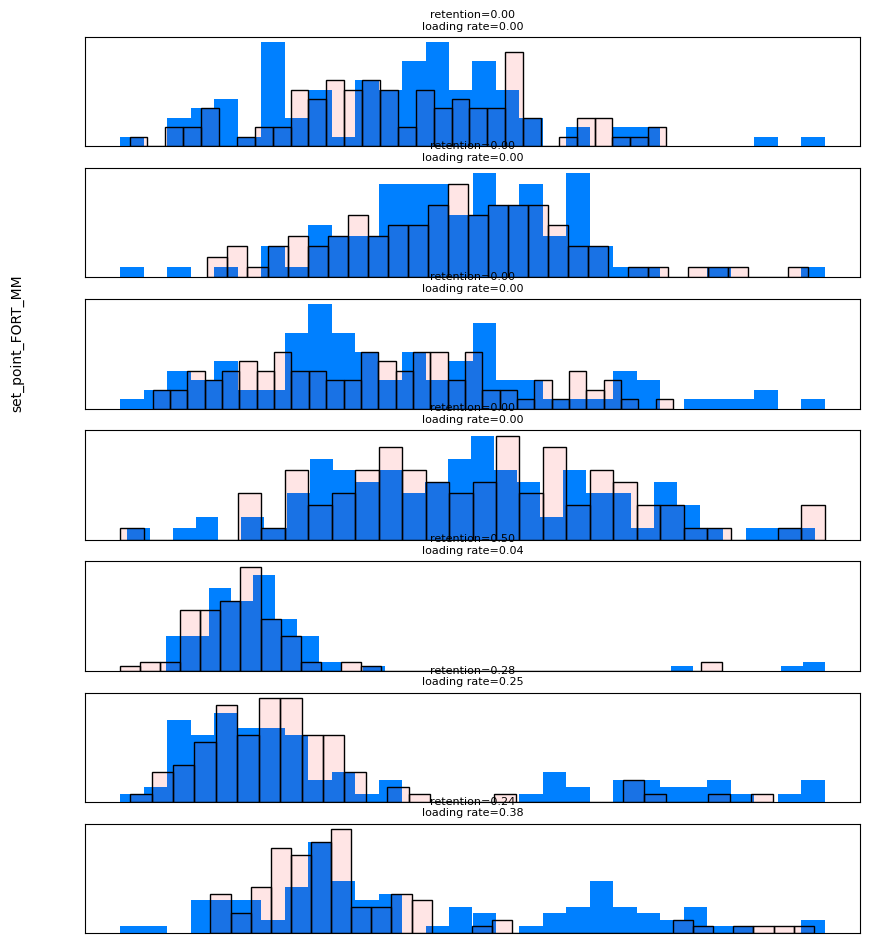

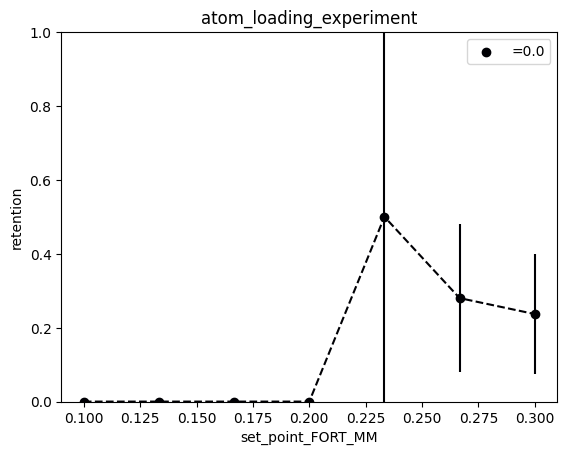

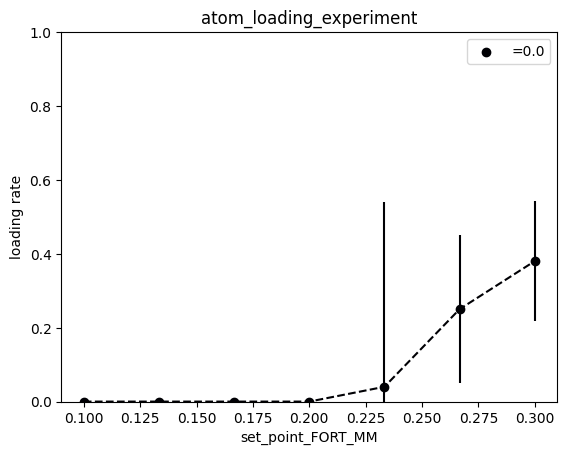

In [72]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## f_cooling_DP_MOT scan to check if there can be any loading improvement

In [68]:
fname = fnames[16]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
f_cooling_DP_MOT [1.11000000e+08 1.11555556e+08 1.12111111e+08 1.12666667e+08
 1.13222222e+08 1.13777778e+08 1.14333333e+08 1.14888889e+08
 1.15444444e+08 1.16000000e+08]
 [0.]


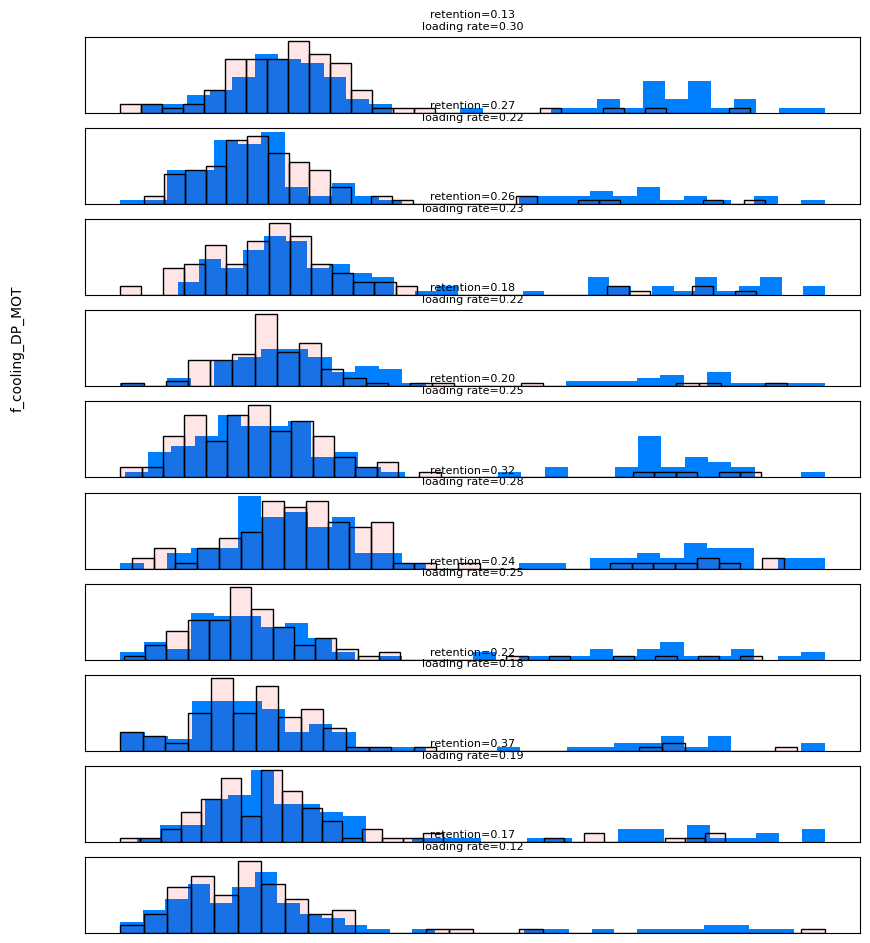

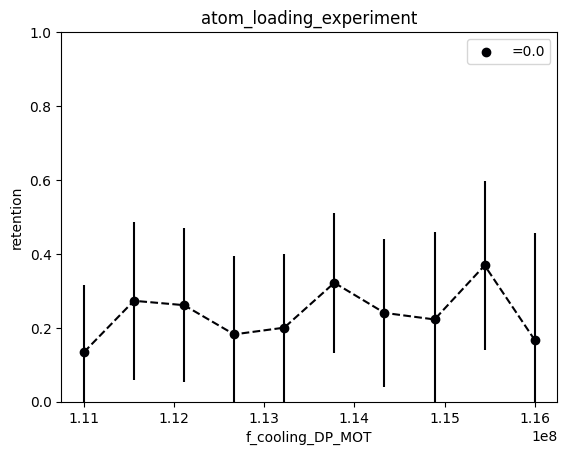

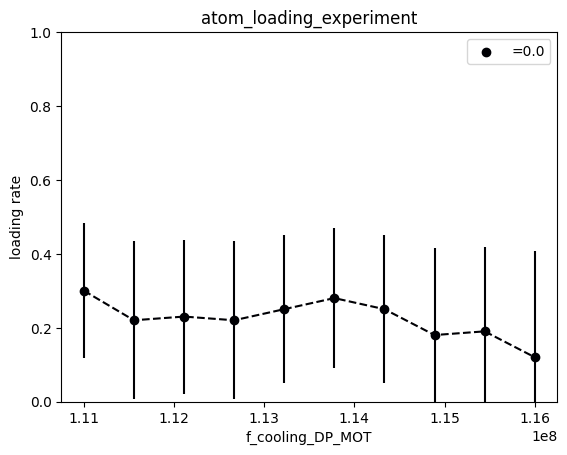

In [69]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## t_MOT_loading scan with FORT_on_at_MOT_start=True

In [63]:
fname = fnames[14] # seems to show a clear advantage for longer MOT loading times, but not statistically significant
fname = fnames[15] # more granular, probably not a big difference from 600 to 1000 ms. 


f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
t_MOT_loading [0.5 0.6 0.7 0.8 1. ]
 [0.]


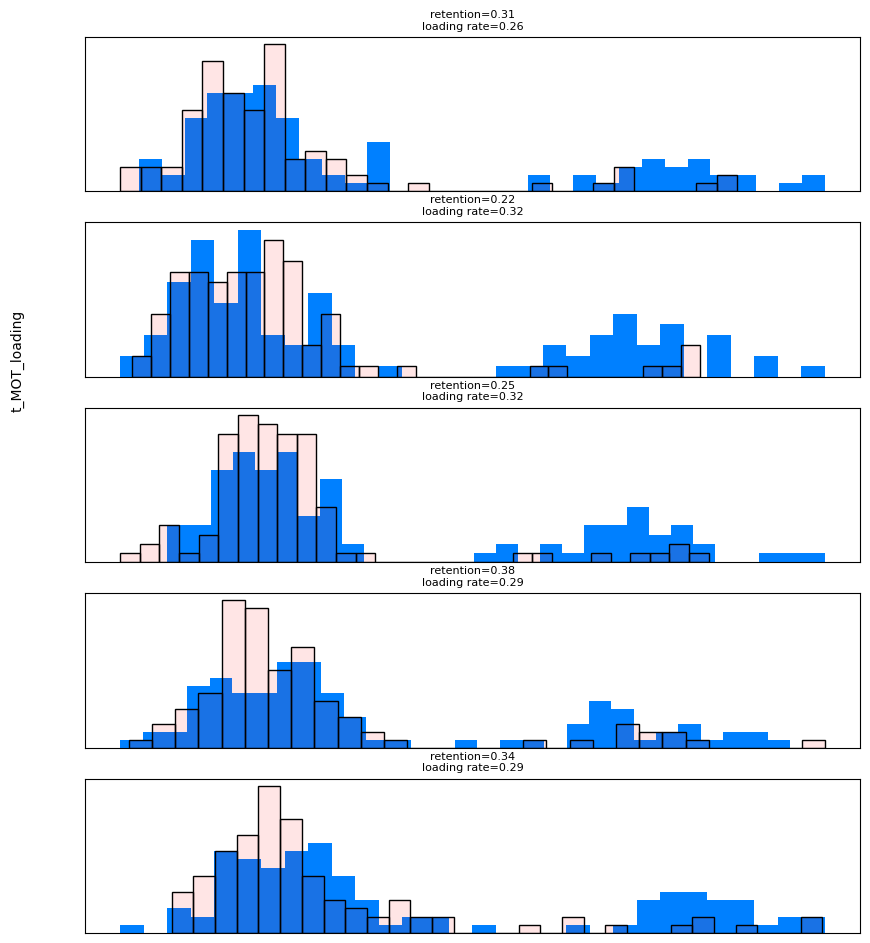

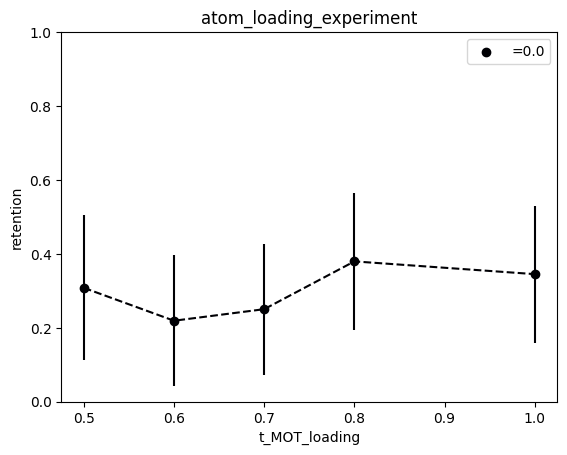

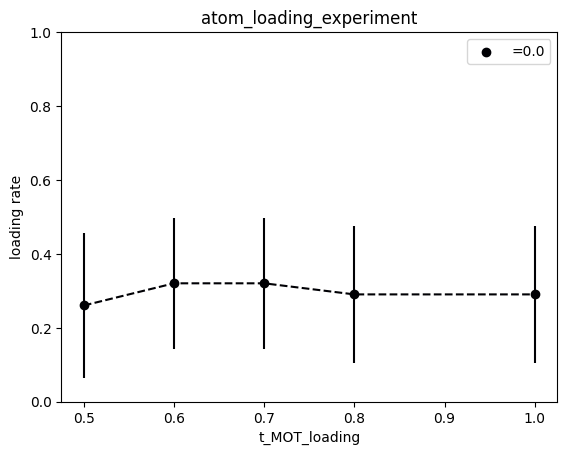

In [66]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))
    plt.ylim((0,1))
    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))
        plt.ylim((0,1))
        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

In [65]:
1/np.sqrt(30)

0.18257418583505536

## comparing turning on FORT right away in the MOT vs not (FORT_on_with_MOT_start)

In [57]:
fname = fnames[4]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
FORT_on_at_MOT_start [0 1]
 [0.]


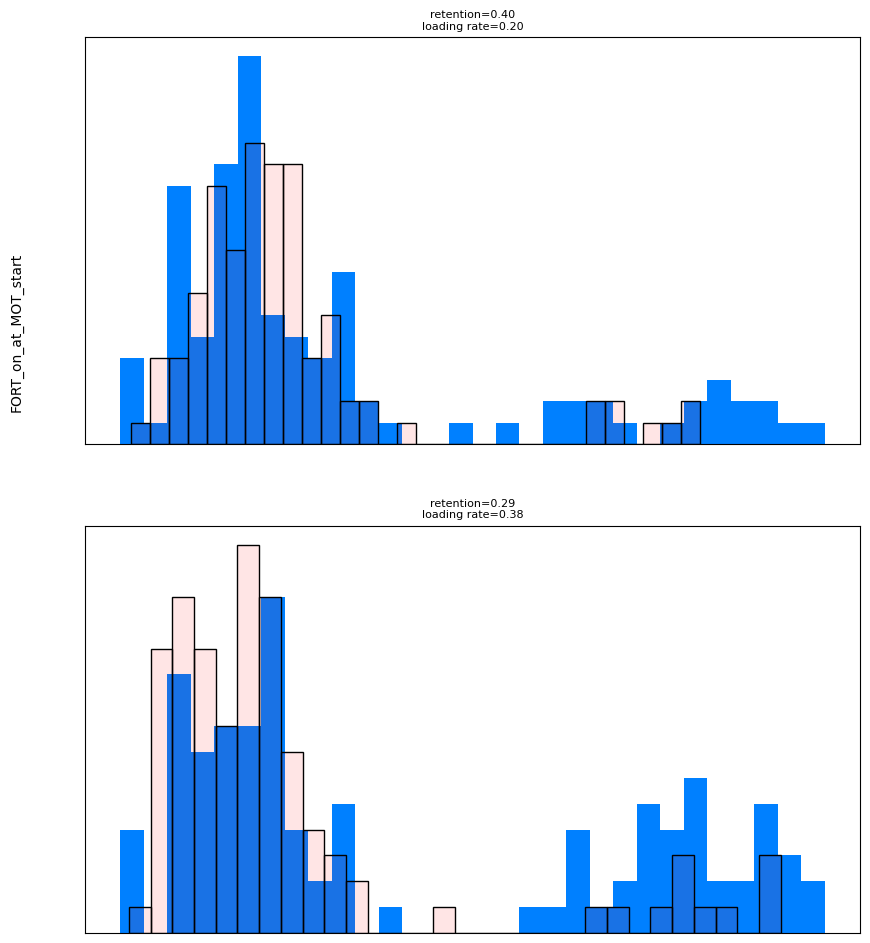

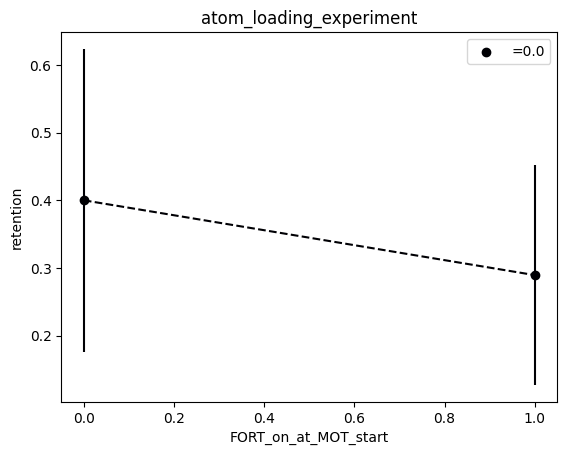

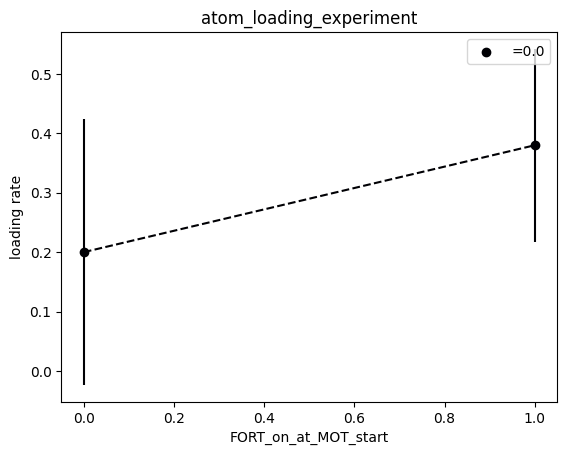

In [58]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## scan over MOT loading time

In [47]:
fname = fnames[1]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
t_FORT_drop = np.float64(f['archive']['t_FORT_drop'])
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
ATTENTION: retention may be low because of 10.0 us FORT drop
t_MOT_loading [0.2   0.275 0.35  0.425 0.5  ]
 [0.]


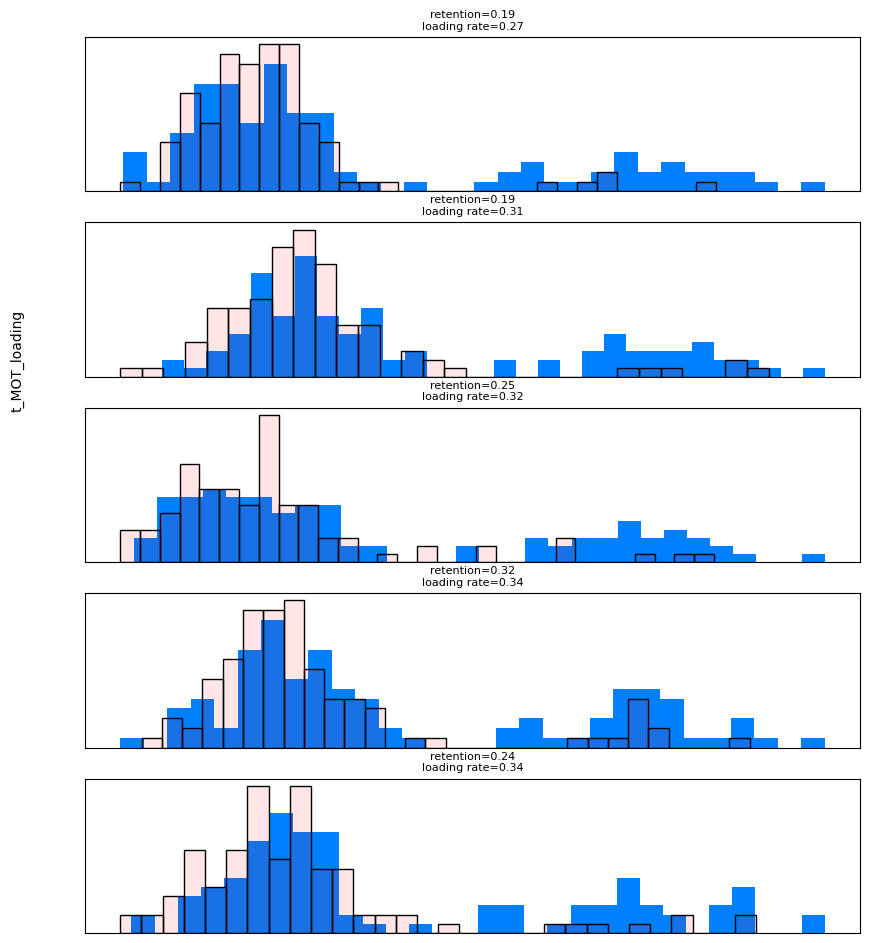

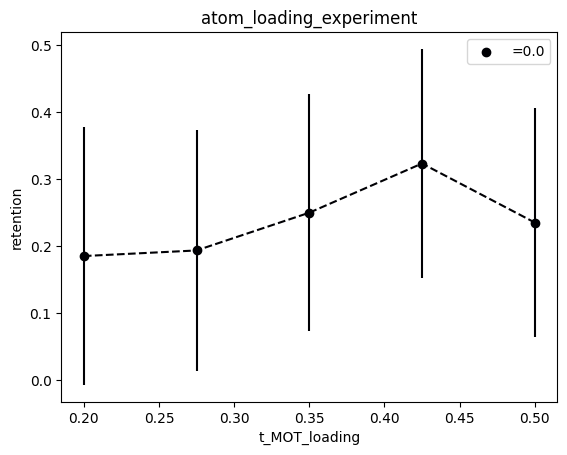

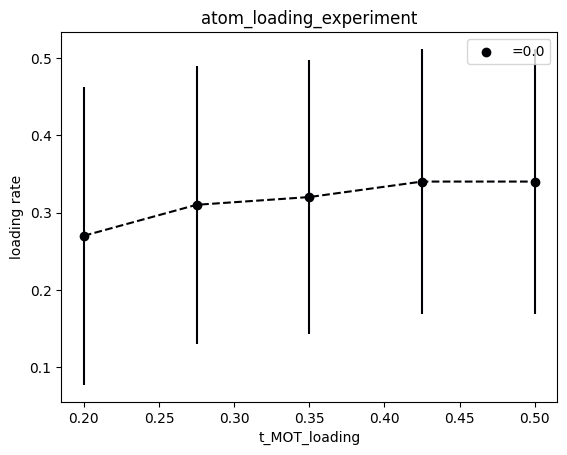

In [48]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## scan over readout time

In [41]:
fname = fnames[0]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
t_SPCM_first_shot [0.002 0.004 0.006 0.008 0.01 ]
 [0.]


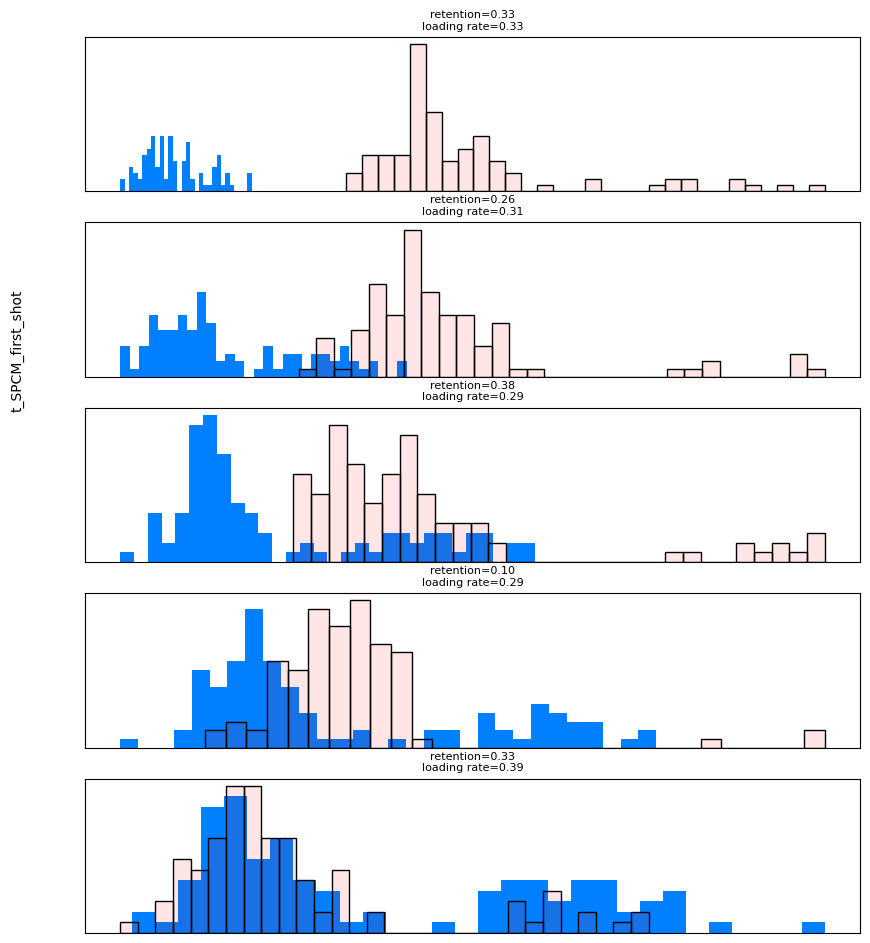

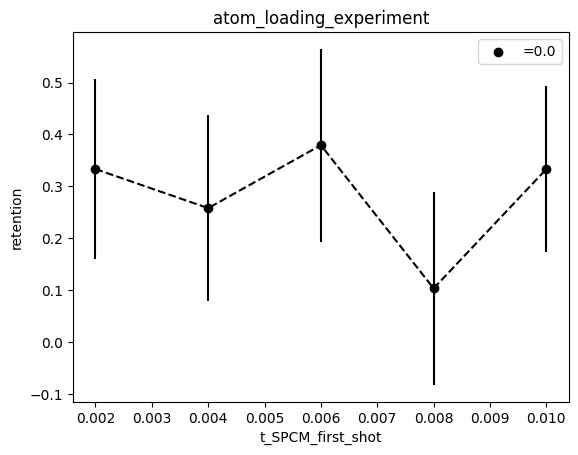

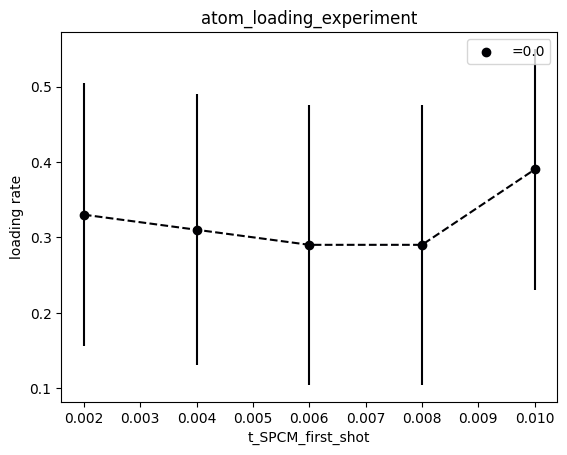

In [42]:
# caution: DON'T COPY THE CELL BELOW FOR OTHER VARIABLE SCANS, since the readout time t_SCPM_first_shot changes how we calculate the atom theshold for each step

showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]

    # THIS IS ONLY VALID IF WE ARE SCANNING THE FIRST READOUT TIME
    cutoff1 = single_atom_counts_per_s*scan_sequence1[i]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## 2024.04.10

In [25]:
fnames = get_files_by_criteria(date_filters=["2024-04-10"], # only find files from these date directories
                               name_filters=["atom_loading"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    scan_str = str_from_h5(ds['scan_variable1_name'])
    if str_from_h5(ds['scan_variable2_name']) != '':
        scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
    print(f"file {i} scanned over "+scan_str)

found 16 files
file 0 scanned over f_cooling_DP_RO
file 1 scanned over f_cooling_DP_RO
file 2 scanned over f_cooling_DP_RO
file 3 scanned over f_cooling_DP_RO
file 4 scanned over f_cooling_DP_RO
file 5 scanned over f_cooling_DP_RO
file 6 scanned over f_cooling_DP_RO
file 7 scanned over f_cooling_DP_RO
file 8 scanned over f_cooling_DP_RO
file 9 scanned over t_SPCM_first_shot
file 10 scanned over t_SPCM_first_shot
file 11 scanned over t_SPCM_first_shot
file 12 scanned over p_cooling_DP_RO
file 13 scanned over p_cooling_DP_RO
file 14 scanned over t_MOT_dissipation
file 15 scanned over dummy_variable


## scan over nothing (dummy_variable) to check loading and retention consistency

In [38]:
fname = fnames[15]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
dummy_variable [0.02 0.03]
 [0.]


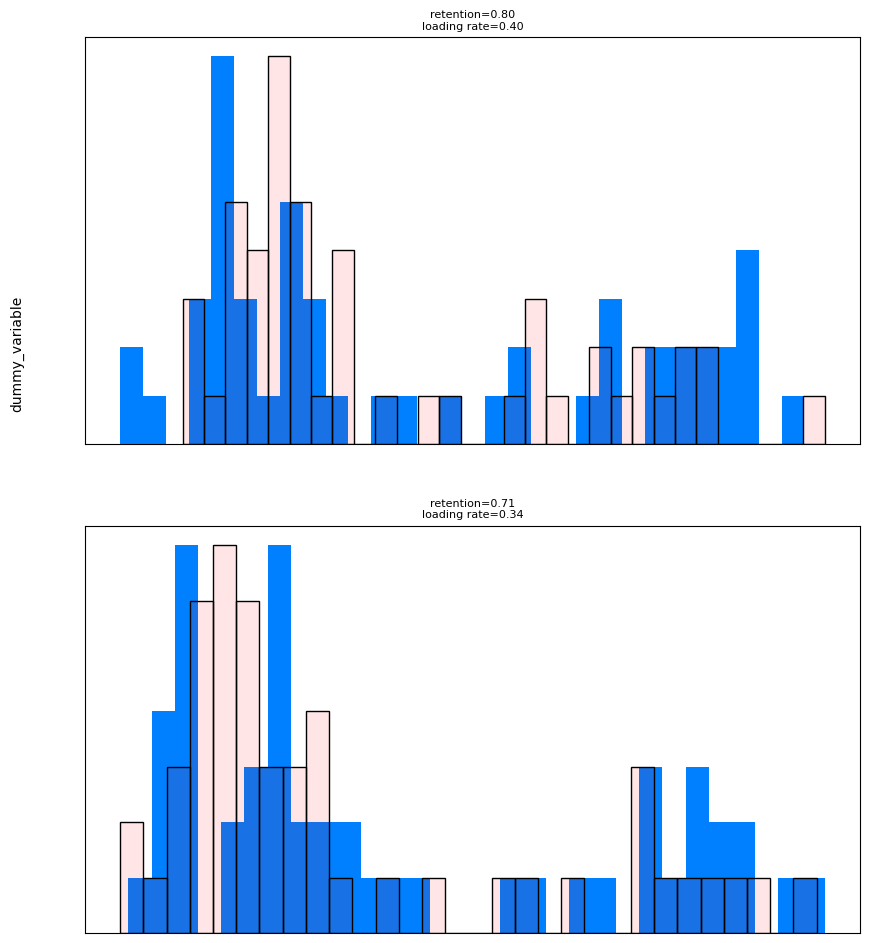

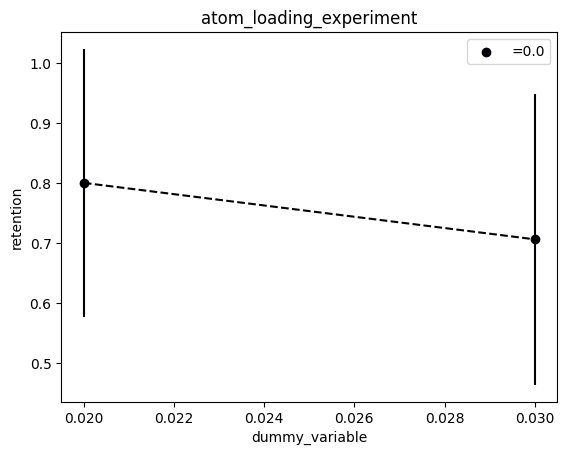

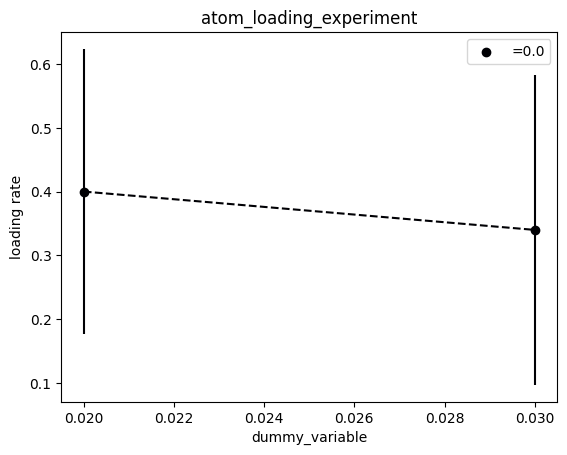

In [39]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

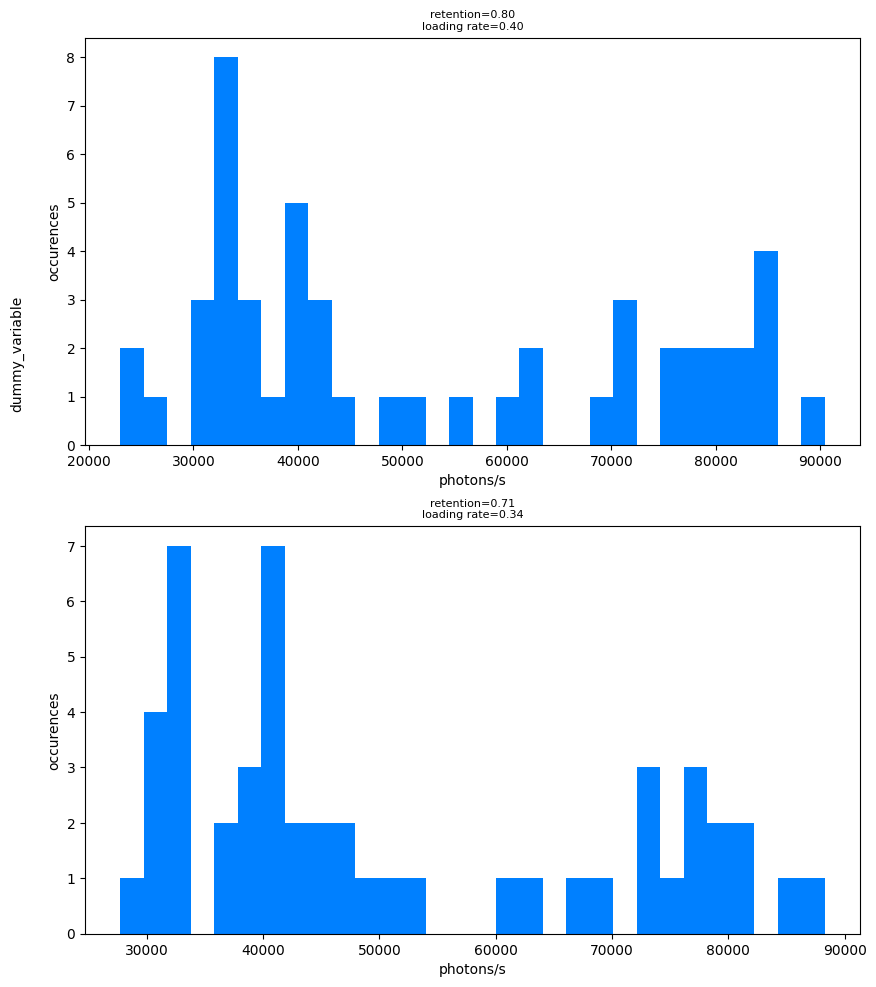

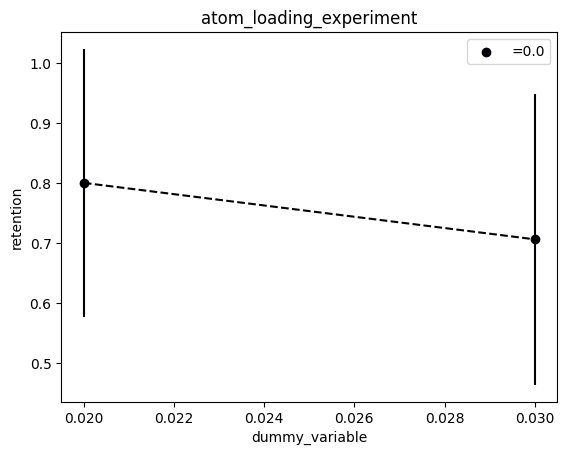

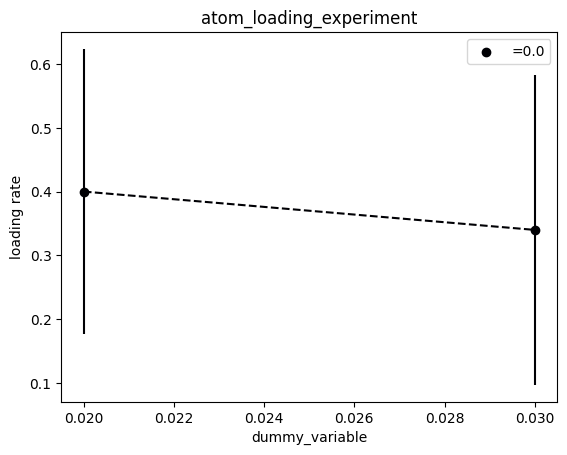

In [35]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1/t_SPCM_first_shot,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        # ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        ax.set_ylabel("occurences")
        ax.set_xlabel("photons/s")
        # ax.set_xticks([])
        # ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## scan over readout time

In [10]:
fname = fnames[9]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
t_SPCM_first_shot [0.007      0.00844444 0.00988889 0.01133333 0.01277778 0.01422222
 0.01566667 0.01711111 0.01855556 0.02      ]
 [0.]


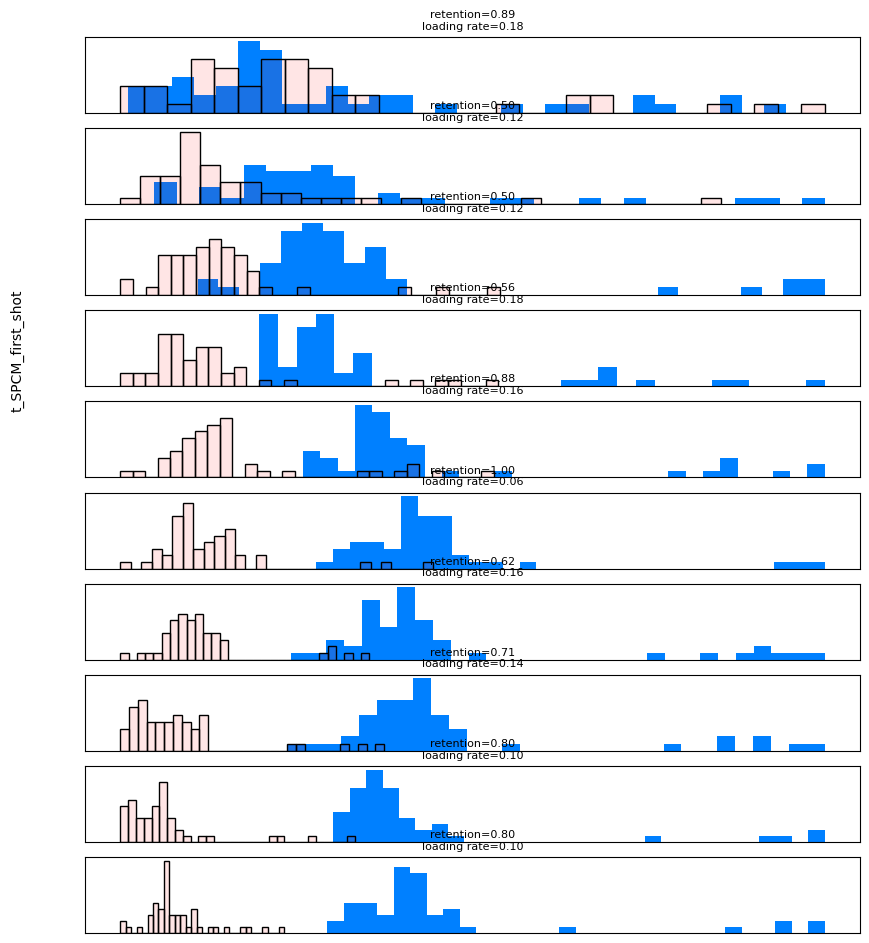

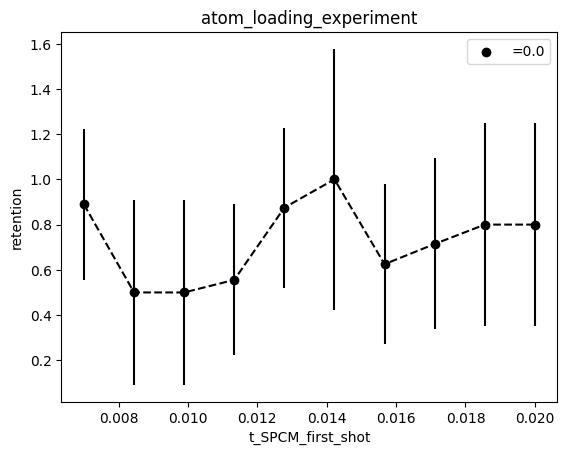

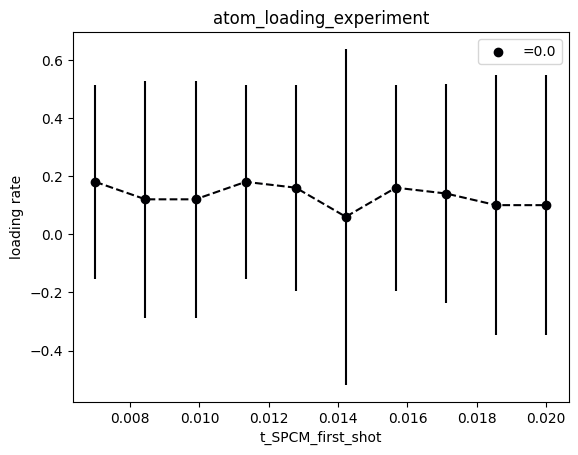

In [14]:
# caution: don't copy the cell below for other variable scans, since the readout time t_SCPM_first_shot changes how we calculate the atom theshold for each step

showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]

    # THIS IS ONLY VALID IF WE ARE SCANNING THE FIRST READOUT TIME
    cutoff1 = single_atom_counts_per_s*scan_sequence1[i]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

## scan over readout detuning

In [16]:
fname = fnames[7]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

try:
    scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
except:
    scan_sequence1 = np.array(f['datasets']['scan_sequence1'])

scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    try:
        scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    except:
        scan_sequence2 = np.array(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
f_cooling_DP_RO [1.20e+08 1.21e+08 1.22e+08 1.23e+08 1.24e+08 1.25e+08]
 [0.]


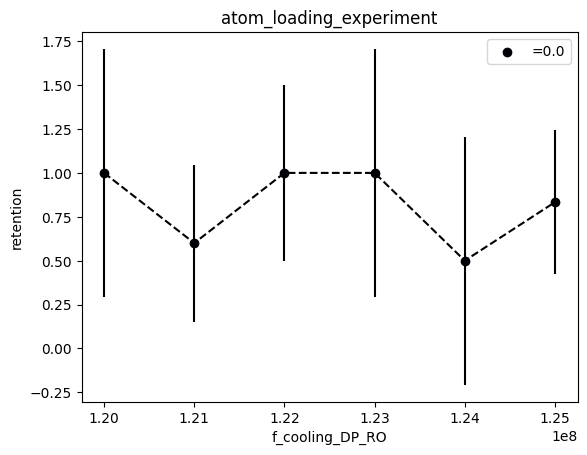

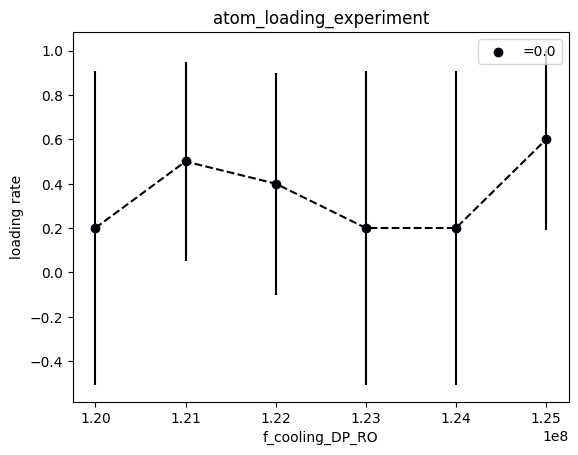

In [17]:
showhist = False
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

In [36]:
fname = fnames[0]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
t_SPCM_first_shot = np.float64(f['archive']['t_SPCM_first_shot'])
t_SPCM_second_shot = np.float64(f['archive']['t_SPCM_second_shot'])
single_atom_counts_per_s = np.uint(f['archive']['single_atom_counts_per_s'])

scan_variable1 = str_from_h5(f['datasets']['scan_variable1_name'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
scan_variable2 = str_from_h5(f['datasets']['scan_variable2_name'])
if scan_variable2 != '':
    scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2_name'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: atom_loading_experiment
f_cooling_DP_RO [1.15e+08 1.16e+08 1.17e+08 1.18e+08 1.19e+08 1.20e+08]
 [0.]


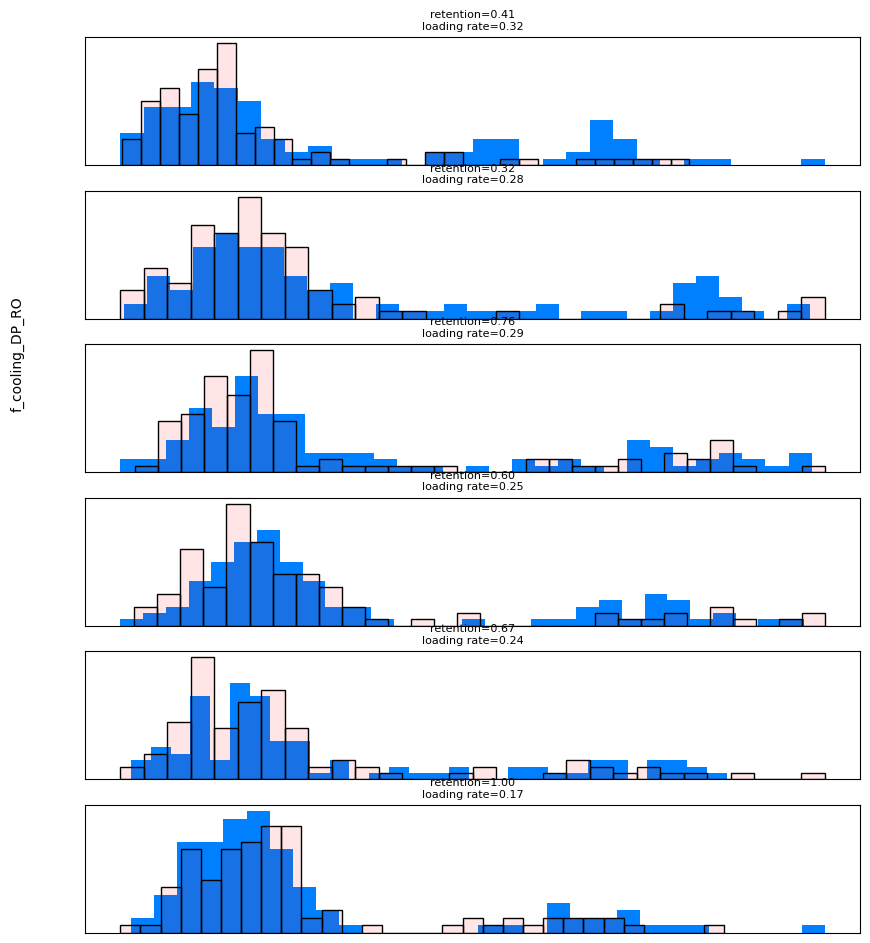

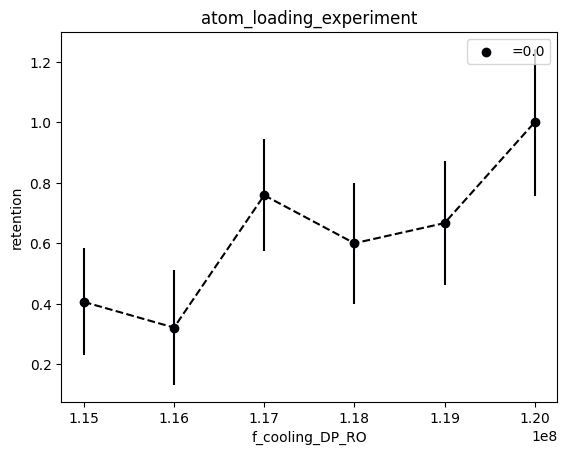

In [21]:
showhist = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))


plt.xlabel(scan_variable1)
plt.ylabel("retention")
plt.legend()
plt.title(experiment_name)
plt.show()

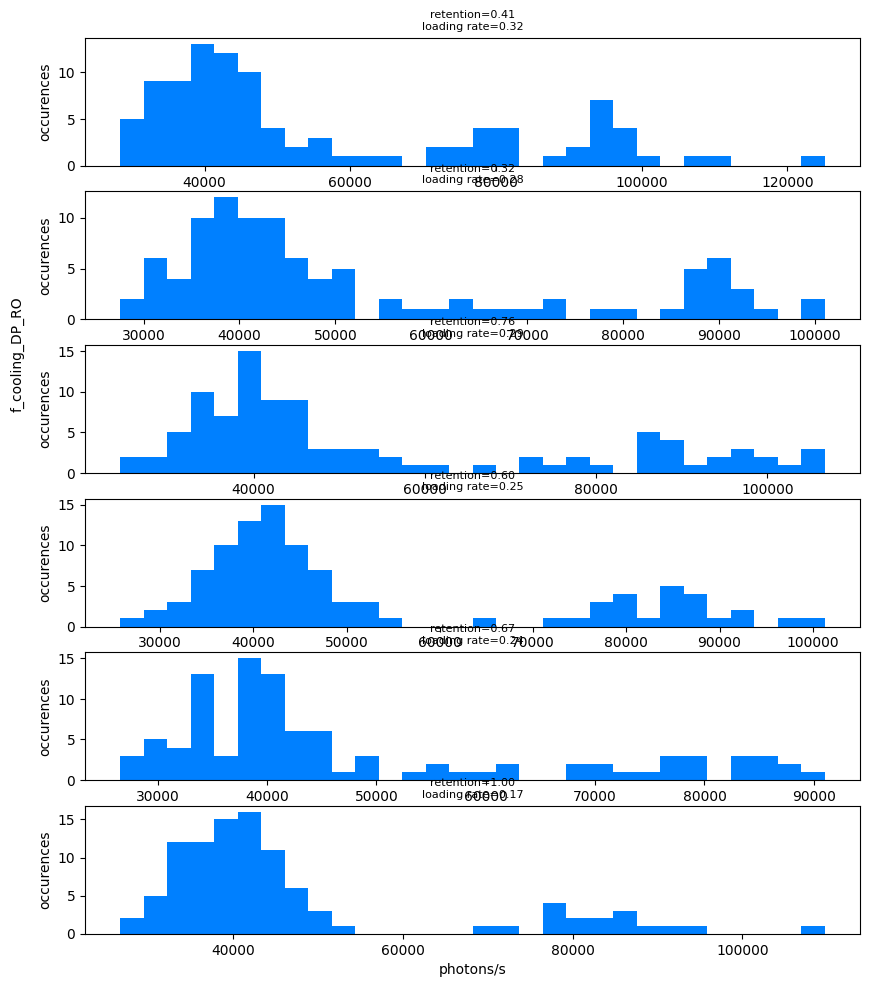

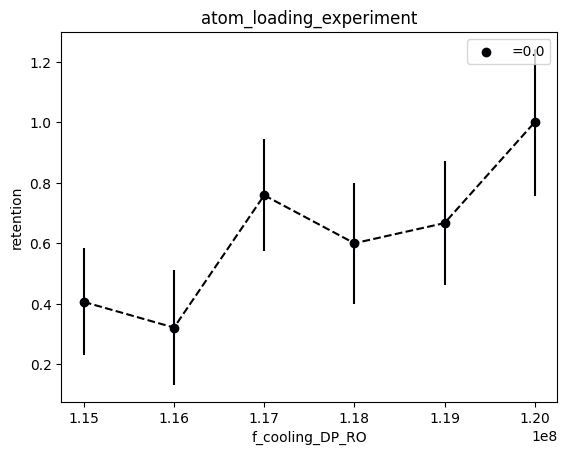

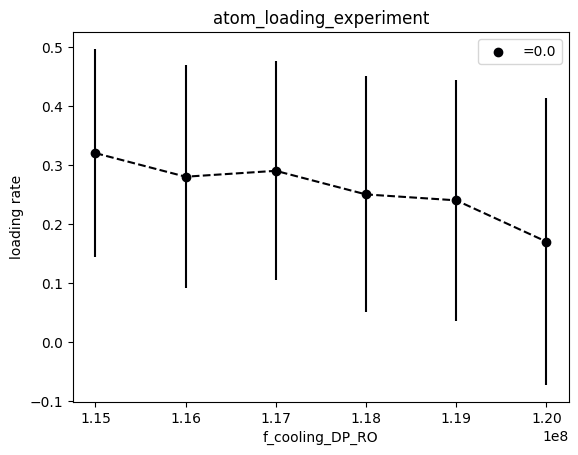

In [37]:
showhist = True
showloading = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1/t_SPCM_first_shot,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        # ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        ax.set_ylabel("occurences")
        ax.set_xlabel("photons/s")
        # ax.set_xticks([])
        # ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_name)
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_name)
        plt.show()

### 2024.01.20

In [10]:
fnames = get_files_by_criteria(date_filters=["2024-01-20"], # only find files from these date directories
                               name_filters=["optical_pumping"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)
print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    ds = h5py.File(os.path.join(results, f))['datasets']
    scan_str = str_from_h5(ds['scan_variable1'])
    if str_from_h5(ds['scan_variable2']) != '':
        scan_str += ", " +str_from_h5(ds['scan_variable2'])
    print(f"file {i} scanned over "+scan_str)

found 4 files
file 0 scanned over t_pumping
file 1 scanned over t_pumping, p_D1_pumping_SP
file 2 scanned over f_D1_pumping_SP, p_D1_pumping_SP
file 3 scanned over p_FORT_OP, t_pumping


#### D1 AOM frequency scan (1D)

In [13]:
fname = fnames[3]

f = h5py.File(os.path.join(results, fname))

experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
scan_variable1 = str_from_h5(f['datasets']['scan_variable1'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
scan_variable2 = str_from_h5(f['datasets']['scan_variable2'])
if scan_variable2 != '':
    scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: optical_pumping_experiment
p_FORT_OP [0.2  0.35 0.5  0.65 0.8 ]
t_pumping [5.00e-05 7.50e-05 1.00e-04 1.25e-04]


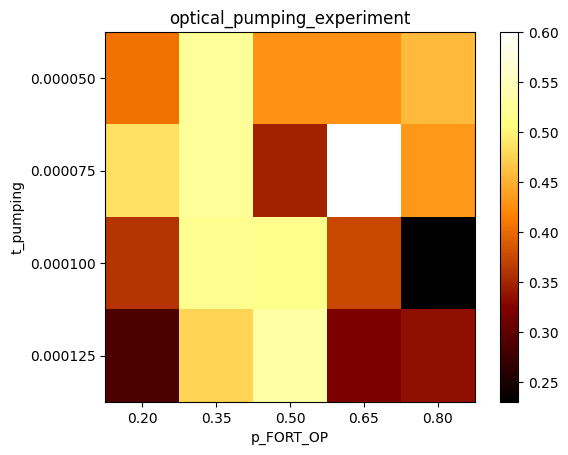

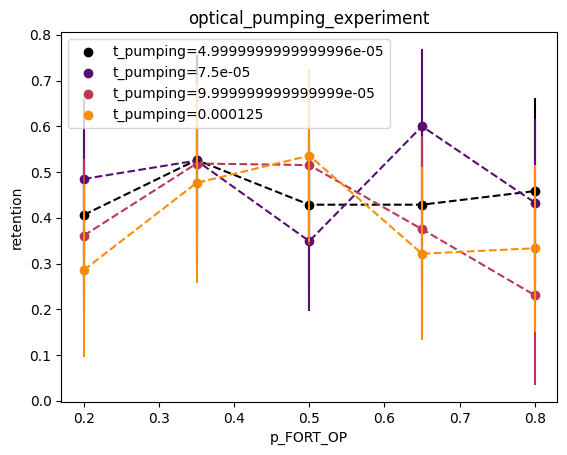

In [14]:
showhist = False

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = 270
cutoff2 = 270
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))


plt.xlabel(scan_variable1)
plt.ylabel("retention")
plt.legend()
plt.title(experiment_name)
plt.show()

## December 2023

### 2023.12.22

#### D1 AOM frequency scan (1D)

In [273]:
fname = "2023-12-22\\17\\000008907-GeneralVariableScan.h5"

f = h5py.File(os.path.join(results, fname))
# [x for x in f['datasets']]

In [274]:
experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
scan_variable1 = str_from_h5(f['datasets']['scan_variable1'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
scan_variable2 = str_from_h5(f['datasets']['scan_variable2'])
if scan_variable2 != '':
    scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])
    scan_is_2D = True
else:
    scan_sequence2 = np.zeros(1)
    scan_is_2D = False

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

print("MOT AOMs on the whole time?", control_experiment)
print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: optical_pumping
t_pumping [1.e-06 5.e-05]
 [0.]
MOT AOMs on the whole time? False
Blow-away light off? False
Pumping light off? False


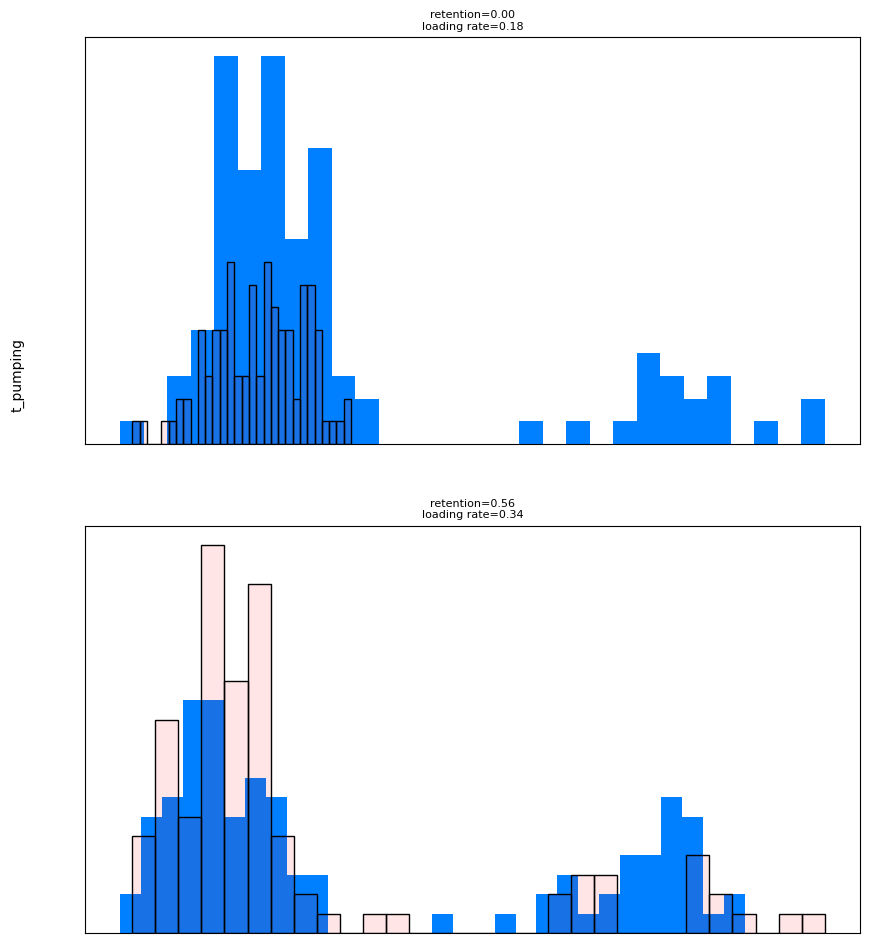

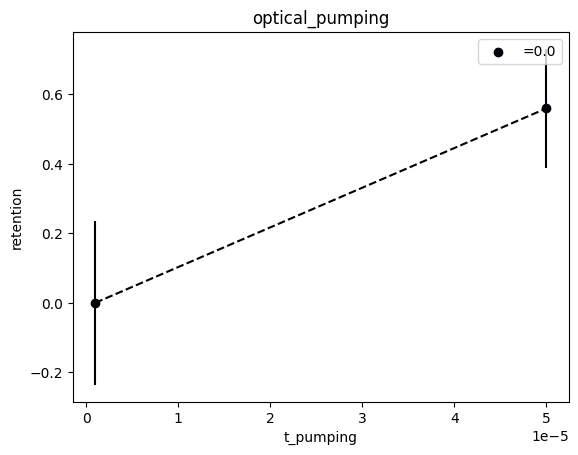

In [275]:
showhist = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = 270
cutoff2 = 270
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
if scan_is_2D:
    dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    if scan_is_2D: # todo
        axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
        [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
        [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
        [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

if scan_is_2D:
    # plot a colormap of the retention
    fig,ax = plt.subplots()
    cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
                  extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
    im = ax.get_images()
    extent =  im[0].get_extent()
    # plt.setp(ax.spines.values(), linewidth=0.1)
    ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
    ax.set_xticks(scan_sequence1)
    ax.set_yticks(scan_sequence2)
    ax.set_title(experiment_name)
    ax.set_xlabel(scan_variable1)
    ax.set_ylabel(scan_variable2)
    # ax.tick_params(axis='both', labelsize=10)
    fig.colorbar(cax)
    # plt.clim(0,1)
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))


plt.xlabel(scan_variable1)
plt.ylabel("retention")
plt.legend()
plt.title(experiment_name)
plt.show()

#### timing and D1 AOM frequency scan

In [256]:
fname = "2023-12-22\\16\\000008903-GeneralVariableScan.h5"

f = h5py.File(os.path.join(results, fname))
# [x for x in f['datasets']]

In [259]:
experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
scan_variable1 = str_from_h5(f['datasets']['scan_variable1'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
scan_variable2 = str_from_h5(f['datasets']['scan_variable2'])
scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

print("MOT AOMs on the whole time?", control_experiment)
print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: optical_pumping
t_pumping [5.0e-05 1.0e-04 1.5e-04]
f_D1_pumping_SP [85000000. 87500000. 90000000. 92500000. 95000000.]
MOT AOMs on the whole time? False
Blow-away light off? False
Pumping light off? False


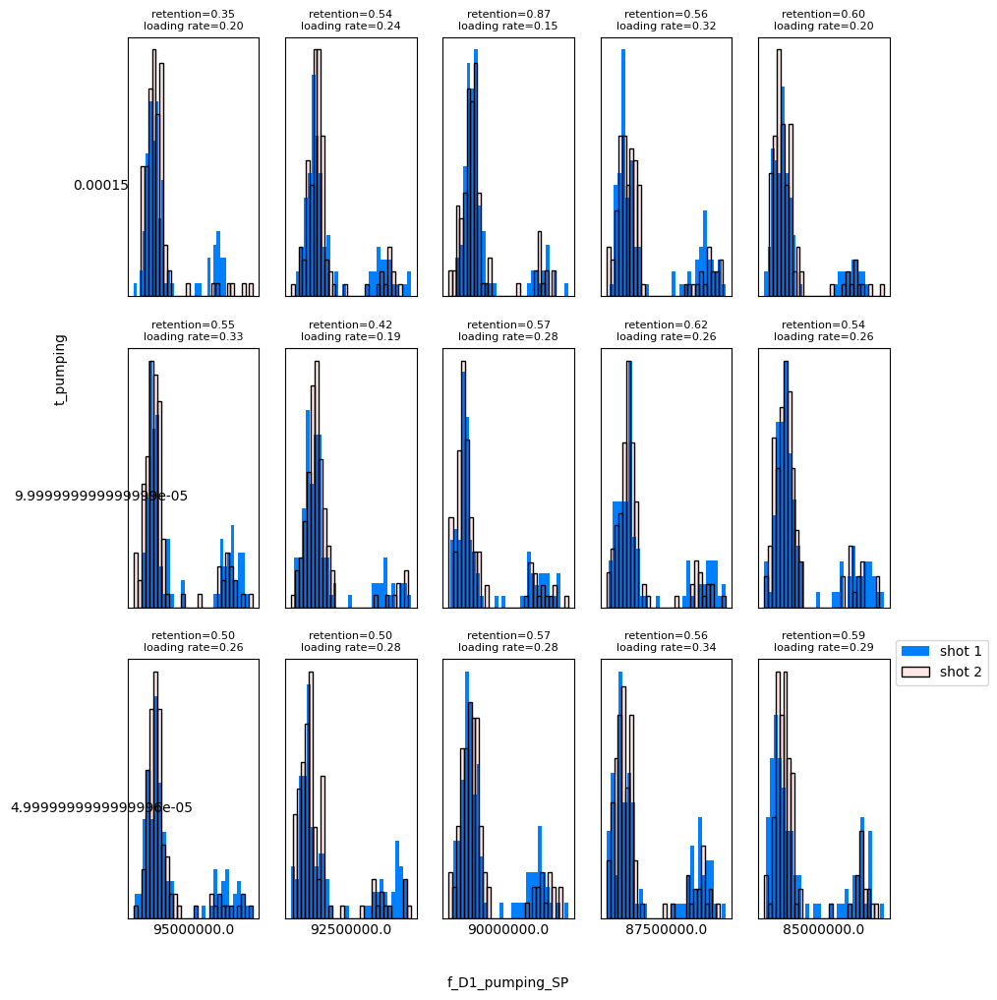

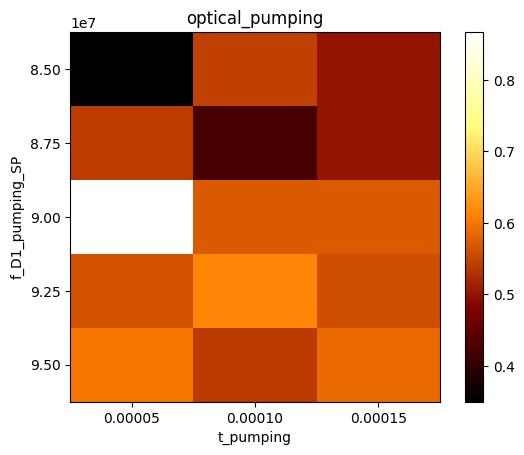

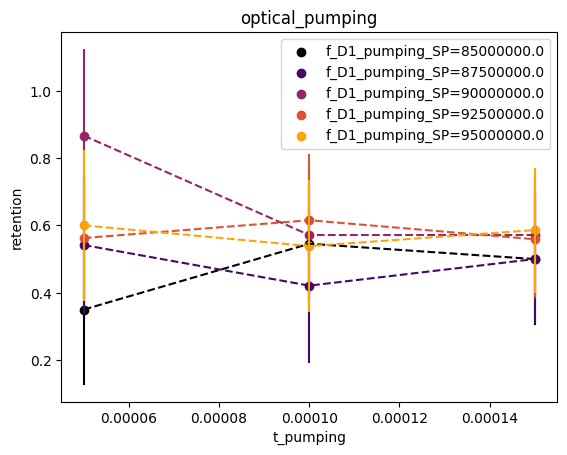

In [260]:
showhist = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = 270
cutoff2 = 270
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
    [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
    [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
    [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

# plot a colormap of the retention
fig,ax = plt.subplots()
cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
              extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
im = ax.get_images()
extent =  im[0].get_extent()
# plt.setp(ax.spines.values(), linewidth=0.1)
ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
ax.set_xticks(scan_sequence1)
ax.set_yticks(scan_sequence2)
ax.set_title(experiment_name)
ax.set_xlabel(scan_variable1)
ax.set_ylabel(scan_variable2)
# ax.tick_params(axis='both', labelsize=10)
fig.colorbar(cax)
# plt.clim(0,1)
plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))


plt.xlabel(scan_variable1)
plt.ylabel("retention")
plt.legend()
plt.title(experiment_name)
plt.show()

In [261]:
max(retention_array)

0.8666666666666667

#### D1 AOM power and FORT AOM power scan

In [242]:
fname = "2023-12-22\\16\\000008901-GeneralVariableScan.h5"

f = h5py.File(os.path.join(results, fname))
# [x for x in f['datasets']]

In [243]:
experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
scan_variable1 = str_from_h5(f['datasets']['scan_variable1'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
scan_variable2 = str_from_h5(f['datasets']['scan_variable2'])
scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

print("MOT AOMs on the whole time?", control_experiment)
print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: optical_pumping
p_FORT_OP [0.2, 0.3, 0.4, 0.5]
p_D1_pumping_SP [-11, -9, -7]
MOT AOMs on the whole time? False
Blow-away light off? False
Pumping light off? False


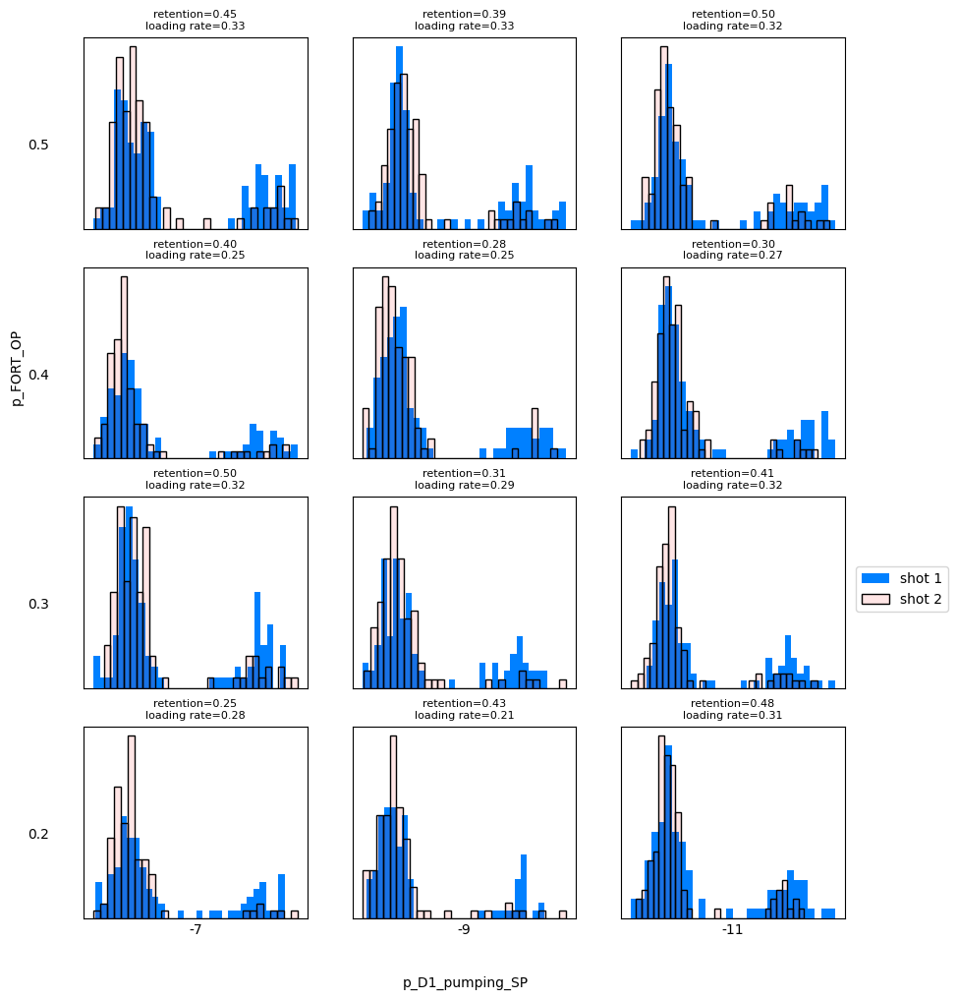

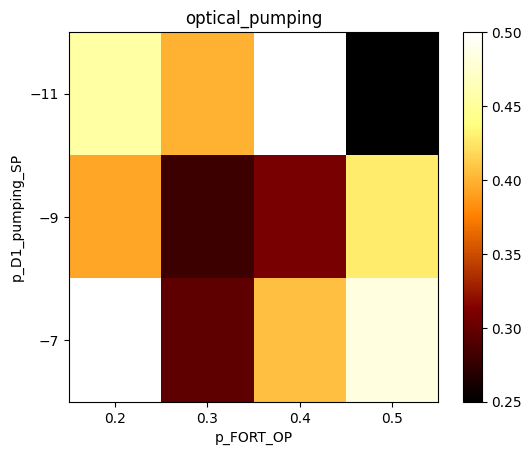

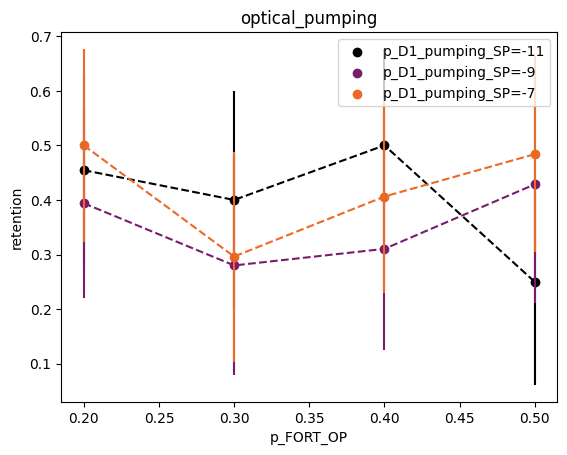

In [251]:
showhist = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = 260
cutoff2 = 260
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
    [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
    [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
    [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

# plot a colormap of the retention
fig,ax = plt.subplots()
cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
              extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
im = ax.get_images()
extent =  im[0].get_extent()
# plt.setp(ax.spines.values(), linewidth=0.1)
ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
ax.set_xticks(scan_sequence1)
ax.set_yticks(scan_sequence2)
ax.set_title(experiment_name)
ax.set_xlabel(scan_variable1)
ax.set_ylabel(scan_variable2)
# ax.tick_params(axis='both', labelsize=10)
fig.colorbar(cax)
# plt.clim(0,1)
plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))


plt.xlabel(scan_variable1)
plt.ylabel("retention")
plt.legend()
plt.title(experiment_name)
plt.show()

#### X and Z coil scan

In [2]:
fname = "2023-12-21\\18\\000008878-GeneralVariableScan.h5" # 2D scan over Z top coil and X coil voltage
fname = "2023-12-22\\11\\000008894-GeneralVariableScan.h5" # 2D scan over Z top coil and X coil voltage
# fname = "2023-12-22\\12\\000008896-GeneralVariableScan.h5" # corrupt file
# fname = "2023-12-22\\13\\000008897-GeneralVariableScan.h5" # corrupt file
fname = "2023-12-22\\14\\000008898-GeneralVariableScan.h5"

f = h5py.File(os.path.join(results, fname))
# [x for x in f['datasets']]

In [7]:
experiment_name = str_from_h5(f['datasets']['experiment_function'])
print("experiment:",experiment_name)

n_measurements = np.uint(f['datasets']['n_measurements'])
scan_variable1 = str_from_h5(f['datasets']['scan_variable1'])
# scan_variable1_unit = str_from_h5(f['datasets']['scan_sequence1'])[] # todo

scan_sequence1 = eval_str_from_h5(f['datasets']['scan_sequence1'])
scan_variable2 = str_from_h5(f['datasets']['scan_variable2'])
scan_sequence2 = eval_str_from_h5(f['datasets']['scan_sequence2'])

print(scan_variable1,scan_sequence1)
print(scan_variable2,scan_sequence2)

iterations = len(scan_sequence1)*len(scan_sequence2)

counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
# print("Pumping light off?", pumping_light_off)

assert len(counts_shot1) == (iterations*n_measurements), "warning: the experiment may have ended prematurely"

experiment: optical_pumping
AX_volts_OP [2.    2.125 2.25  2.375 2.5  ]
AZ_top_volts_OP [-1.25  -1.125 -1.    -0.875 -0.75 ]


In [14]:
np.float64(f['archive']['AZ_bottom_volts_MOT']), np.float64(f['archive']['AZ_top_volts_MOT']),np.float64(f['archive']['AX_volts_MOT']),np.float64(f['archive']['AY_volts_MOT'])

(4.055, 4.501, 0.428, 0.141)

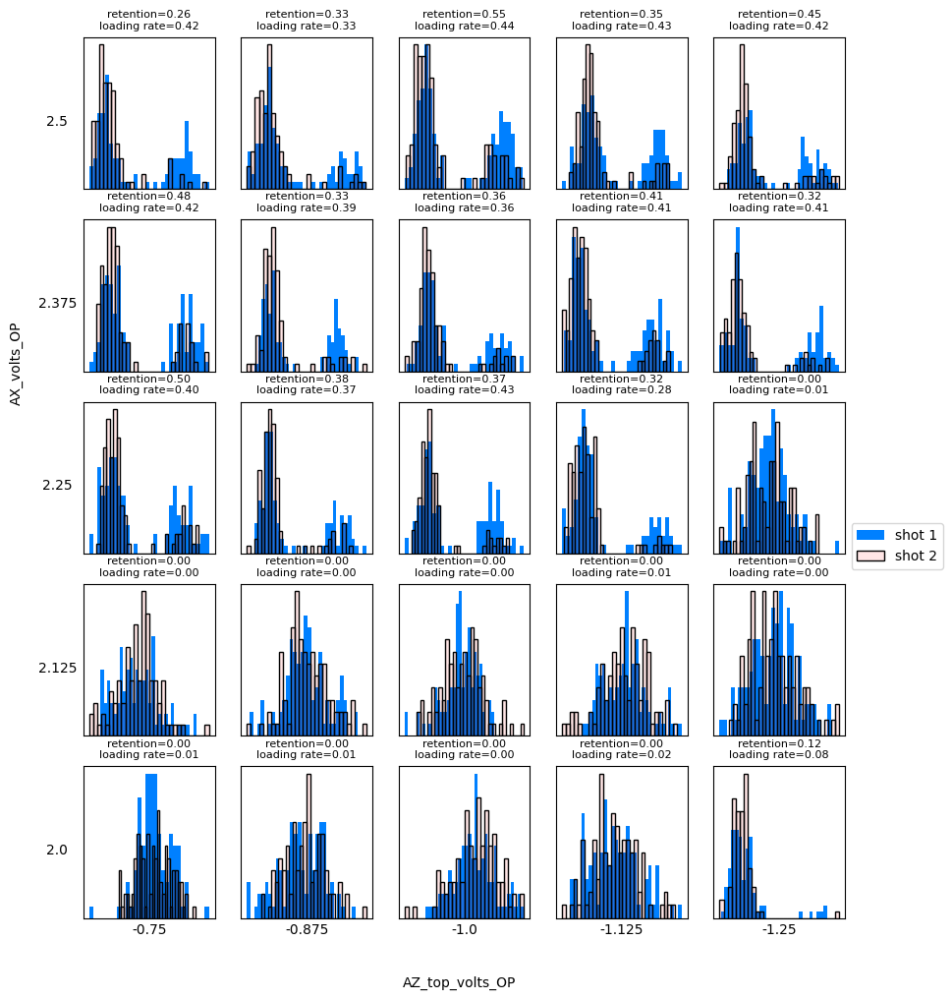

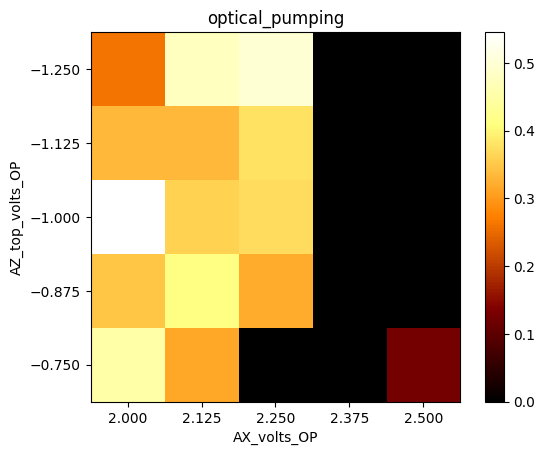

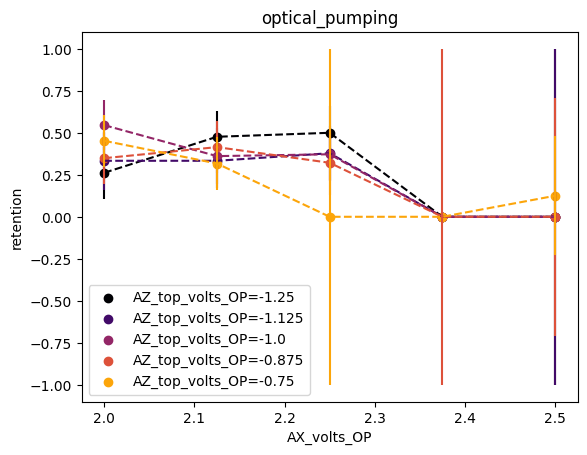

In [6]:
showhist = True

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = 260
cutoff2 = 260
retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

dvar1 = abs(scan_sequence1[1]-scan_sequence1[0])
dvar2 = abs(scan_sequence2[1]-scan_sequence2[0])

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7))
    for i, ax in enumerate(axes.flat):
        shot1 = counts_shot1[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        # ax.set_ylabel("occurences")
        # ax.set_xlabel("photons")
        ax.set_xticks([])
        ax.set_yticks([])
    axes.flat[ncols-1].legend(loc=(1.05,-nrows/2))
    [axes[-1,ncols-i-1].set_xlabel(var2) for i,var2 in enumerate(scan_sequence2)]
    [axes[nrows-i-1,0].set_ylabel(var1,rotation=0) for i,var1 in enumerate(scan_sequence1)]
    [axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
    fig.text(0.45,-0.5, scan_variable2)
    fig.text(0.05,0.35, scan_variable1,rotation=90)
    plt.subplots_adjust(bottom=-0.4)
    plt.show()

# plot a colormap of the retention
fig,ax = plt.subplots()
cax=ax.imshow(retention_raveled,cmap='afmhot',interpolation='none',
              extent=[scan_sequence1[0]-dvar1/2,scan_sequence1[-1]+dvar1/2,scan_sequence2[-1]+dvar2/2,scan_sequence2[0]-dvar2/2])
im = ax.get_images()
extent =  im[0].get_extent()
# plt.setp(ax.spines.values(), linewidth=0.1)
ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2])))
ax.set_xticks(scan_sequence1)
ax.set_yticks(scan_sequence2)
ax.set_title(experiment_name)
ax.set_xlabel(scan_variable1)
ax.set_ylabel(scan_variable2)
# ax.tick_params(axis='both', labelsize=10)
fig.colorbar(cax)
# plt.clim(0,1)
plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))


plt.xlabel(scan_variable1)
plt.ylabel("retention")
plt.legend()
plt.title(experiment_name)
plt.show()

[0.54545455 0.36111111 0.37209302 0.         0.        ]


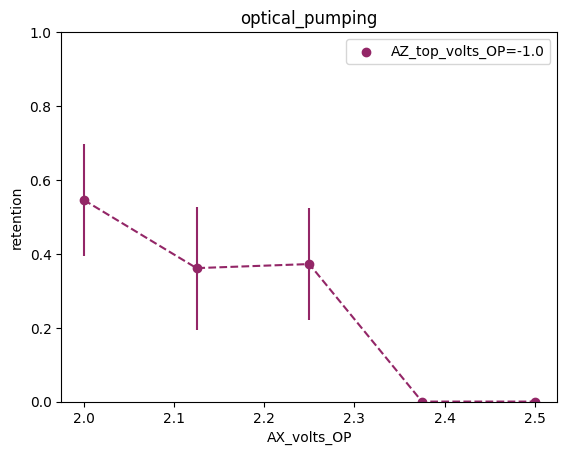

In [255]:
# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):

    # data = np.transpose(scan_sequence1, retention)
    if i == 2:
        print(retention)
        plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))


plt.xlabel(scan_variable1)
plt.ylim((0,1))
plt.ylabel("retention")
plt.legend()
plt.title(experiment_name)
plt.show()

In [237]:
np.transpose([[1,3,3],[1,3,3]])

array([[1, 1],
       [3, 3],
       [3, 3]])

### 2023.12.20

In [2]:
# fname = "2023-12-19\\22\\000008718-SingleAtomOpticalPumpingScan.h5" # control with no OP or BA. clear evidence for pumping but only ~ 0.5 transfer. no bias field applied
fname = "2023-12-20\\09\\000008723-SingleAtomOpticalPumpingScan.h5" # control with BA but no OP. ~ 1 G bias along Y (mirror axis) but no fine tuning.
# fname = "2023-12-20\\10\\000008725-SingleAtomOpticalPumpingScan.h5" # same. I add an experiment variable for the FORT power during the OP
fname = "2023-12-20\\11\\000008728-SingleAtomOpticalPumpingScan.h5" # I physically blocked the pumping repump


f = h5py.File(os.path.join(results, fname))
# [x for x in f['datasets']]

In [3]:
n_measurements = np.uint(f['datasets']['n_measurements'])
control_experiment = np.bool_(f['datasets']['control_experiment'])

blowaway_light_off = np.bool_(f['datasets']['blowaway_light_off'])
pumping_light_off = np.bool_(f['datasets']['only_exclude_pumping_light'])

print("control experiment?", control_experiment)
if control_experiment:
    print("only excluded pumping light?", pumping_light_off)

if control_experiment:
    counts_shot1_all = list(f['datasets']['photocounts'])[1:]
    counts_shot1_control = [counts_shot1_all[i] for i in range(len(counts_shot1_all)) if i%2==0]
    counts_shot1 = [counts_shot1_all[i] for i in range(len(counts_shot1_all)) if i%2==1]

    counts_shot2_all = list(f['datasets']['photocounts2'])[1:]
    counts_shot2_control = [counts_shot2_all[i] for i in range(len(counts_shot1_all)) if i%2==0]
    counts_shot2 = [counts_shot2_all[i] for i in range(len(counts_shot1_all)) if i%2==1]
else:
    counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
    counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

t_arr = eval_str_from_h5(f['datasets']['t_pumping_sequence'])
print("MOT AOMs on the whole time?", control_experiment)
print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

print("PGC phase?", np.bool_(f['datasets']['do_PGC_in_MOT']))

control experiment? True
only excluded pumping light? True
MOT AOMs on the whole time? True
Blow-away light off? False
Pumping light off? True
PGC phase? False


In [5]:
t_arr

array([0.e+00, 1.e-06, 5.e-06, 2.e-05, 5.e-05])

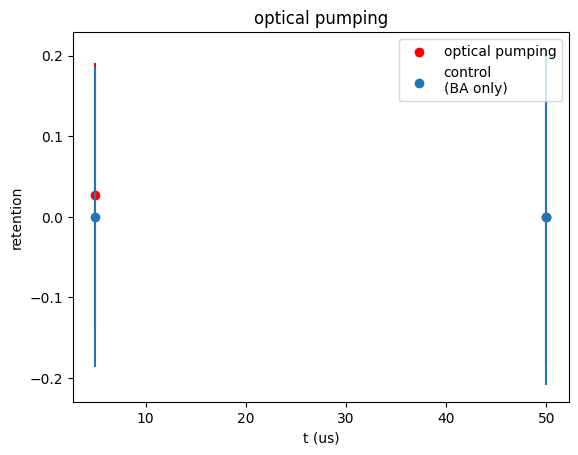

In [4]:
showhist = False

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = [260]*len(t_arr)
cutoff2 = [260]*len(t_arr)
retention_array = np.zeros(len(t_arr))
loading_rate_array = np.zeros(len(t_arr))

n_atoms_loaded_array = np.zeros(len(t_arr))

measurements = n_measurements if not control_experiment else n_measurements//2

for i,t in enumerate(t_arr):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1[i] for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2[i] and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

    if showhist:
        plt.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        plt.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        plt.title(f"retention={retention_fraction:.2f}")
        plt.ylabel("occurences")
        plt.xlabel("photons")
        plt.legend()
        plt.show()

# tau = 30 # us
# tpts = np.linspace(t_arr[0],t_arr[-1],100)/us
# plt.plot(tpts, 0.9*(1-np.exp(-tpts/tau)),color='r',linestyle='--',label=r'$\tau=$'+f'{tau}'+r'$\mu$s')

errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded_array]
plt.scatter(t_arr/us, retention_array, label='optical pumping',color='r')
t_pts = np.linspace(t_arr[0],t_arr[-1],100)
plt.title('optical pumping')
plt.errorbar(t_arr/us,retention_array, errs, ls='none',color='r')
plt.ylabel("retention")
plt.xlabel("t (us)")

if control_experiment:
    retention_array = np.zeros(len(t_arr))
    loading_rate_array = np.zeros(len(t_arr))
    
    n_atoms_loaded_array = np.zeros(len(t_arr))
    
    for i,t in enumerate(t_arr):
        shot1 = counts_shot1_control[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2_control[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1[i] for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2[i] and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        retention_array[i] = retention_fraction
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded
    
    lbl = 'control'
    if pumping_light_off:
        lbl += '\n(BA only)'
    else:
        lbl += '\n(no OP or BA)'
    
    plt.scatter(t_arr/us, retention_array, label=lbl)
    t_pts = np.linspace(t_arr[0],t_arr[-1],100)
    # plt.title('blow away')
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded_array]
    plt.errorbar(t_arr/us,retention_array,errs,ls='none')
    plt.legend()
    # plt.ylabel("retention")
    # plt.xlabel("t (us)")

In [67]:
loading_rate_array

array([0.24 , 0.185, 0.21 , 0.22 , 0.195, 0.235])

### 2023.12.19

In [34]:
fname = "2023-12-19\\16\\000008695-SingleAtomOpticalPumpingScan.h5" # controlled experiment with the blow-away light off
fname = "2023-12-19\\17\\000008704-SingleAtomOpticalPumpingScan.h5" # accidentally had different 1st/2nd shot readout times
fname = "2023-12-19\\22\\000008716-SingleAtomOpticalPumpingScan.h5" # control, only exclude pumping light. looks like all controls are blown away (good) and pumping is acheived in only 1 us. conflicts with 8695 data

f = h5py.File(os.path.join(results, fname))
# [x for x in f['datasets']]

In [40]:
n_measurements = np.uint(f['datasets']['n_measurements'])
control_experiment = np.bool_(f['datasets']['control_experiment'])

blowaway_light_off = np.bool_(f['datasets']['blowaway_light_off'])
pumping_light_off = np.bool_(f['datasets']['only_exclude_pumping_light'])

print("control experiment?", control_experiment)
if control_experiment:
    print("only excluded pumping light?", pumping_light_off)

if control_experiment:
    counts_shot1_all = list(f['datasets']['photocounts'])[1:]
    counts_shot1_control = [counts_shot1_all[i] for i in range(len(counts_shot1_all)) if i%2==0]
    counts_shot1 = [counts_shot1_all[i] for i in range(len(counts_shot1_all)) if i%2==1]

    counts_shot2_all = list(f['datasets']['photocounts2'])[1:]
    counts_shot2_control = [counts_shot2_all[i] for i in range(len(counts_shot1_all)) if i%2==0]
    counts_shot2 = [counts_shot2_all[i] for i in range(len(counts_shot1_all)) if i%2==1]
else:
    counts_shot1 = np.array(f['datasets']['photocounts'])[1:]
    counts_shot2 = np.array(f['datasets']['photocounts2'])[1:]

t_arr = eval_str_from_h5(f['datasets']['t_pumping_sequence'])
print("MOT AOMs on the whole time?", control_experiment)
print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)

print("PGC phase?", np.bool_(f['datasets']['do_PGC_in_MOT']))

control experiment? True
only excluded pumping light? True
MOT AOMs on the whole time? True
Blow-away light off? False
Pumping light off? True
PGC phase? False


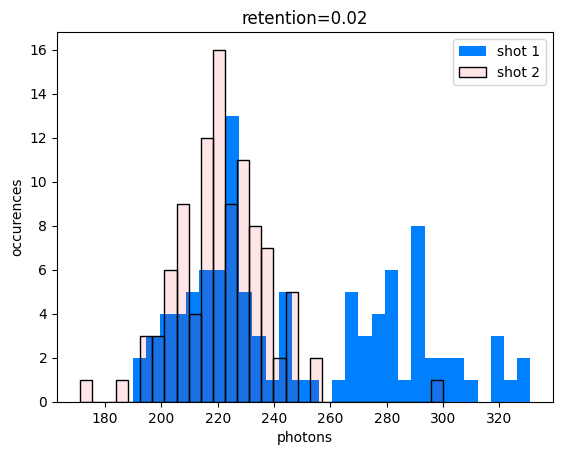

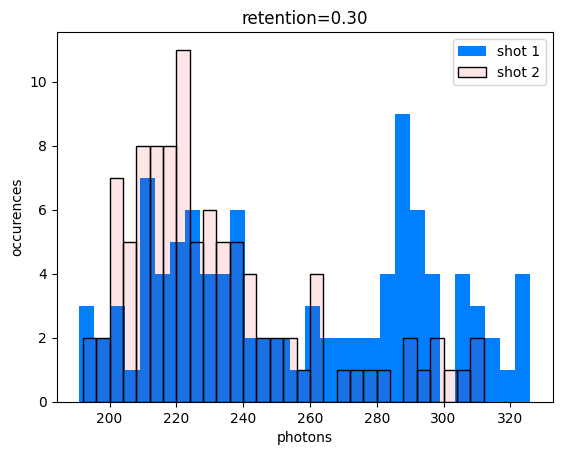

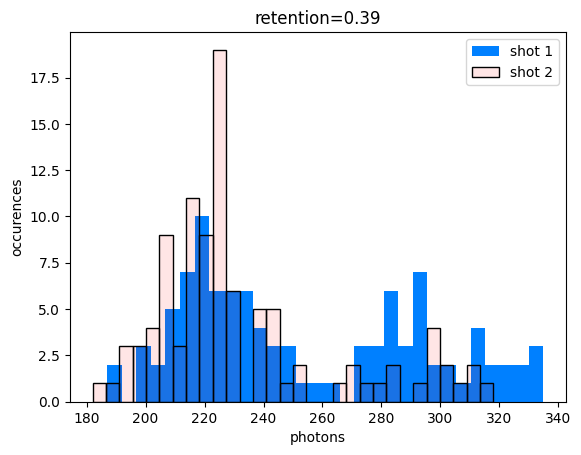

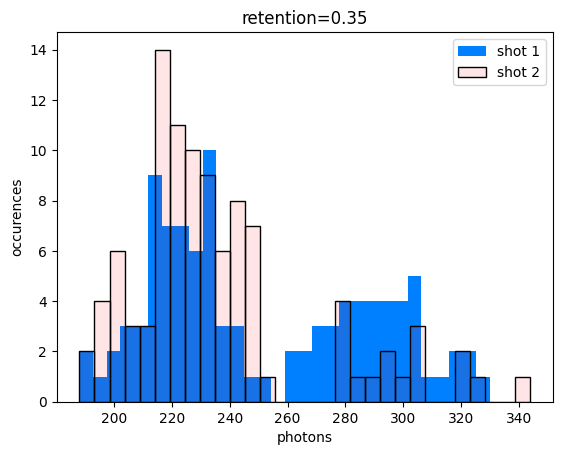

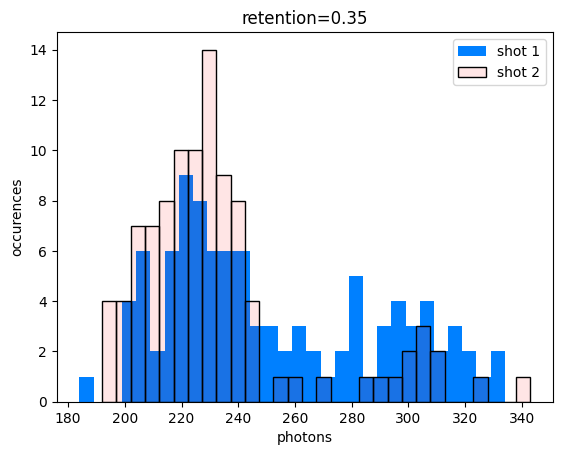

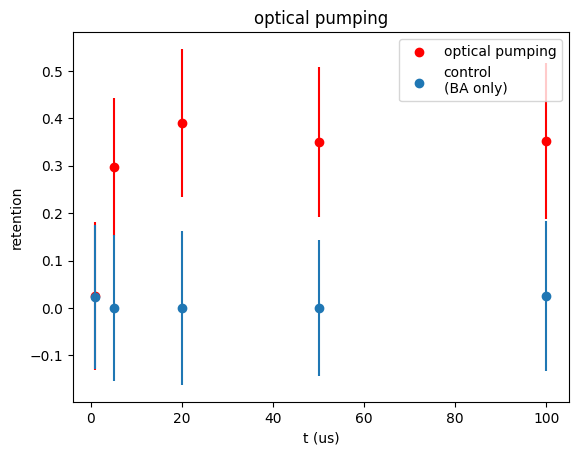

In [41]:
showhist = False

# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
cutoff1 = [260]*len(t_arr)
cutoff2 = [260]*len(t_arr)
retention_array = np.zeros(len(t_arr))
loading_rate_array = np.zeros(len(t_arr))

n_atoms_loaded_array = np.zeros(len(t_arr))

measurements = n_measurements if not control_experiment else n_measurements//2

for i,t in enumerate(t_arr):
    shot1 = counts_shot1[i*measurements:(i+1)*measurements]
    shot2 = counts_shot2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1[i] for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2[i] and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

    if showhist:
        plt.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        plt.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        plt.title(f"retention={retention_fraction:.2f}")
        plt.ylabel("occurences")
        plt.xlabel("photons")
        plt.legend()
        plt.show()

# tau = 30 # us
# tpts = np.linspace(t_arr[0],t_arr[-1],100)/us
# plt.plot(tpts, 0.9*(1-np.exp(-tpts/tau)),color='r',linestyle='--',label=r'$\tau=$'+f'{tau}'+r'$\mu$s')

errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded_array]
plt.scatter(t_arr/us, retention_array, label='optical pumping',color='r')
t_pts = np.linspace(t_arr[0],t_arr[-1],100)
plt.title('optical pumping')
plt.errorbar(t_arr/us,retention_array, errs, ls='none',color='r')
plt.ylabel("retention")
plt.xlabel("t (us)")

if control_experiment:
    retention_array = np.zeros(len(t_arr))
    loading_rate_array = np.zeros(len(t_arr))
    
    n_atoms_loaded_array = np.zeros(len(t_arr))
    
    for i,t in enumerate(t_arr):
        shot1 = counts_shot1_control[i*measurements:(i+1)*measurements]
        shot2 = counts_shot2_control[i*measurements:(i+1)*measurements]
        
        atoms_loaded = [x > cutoff1[i] for x in shot1]
        n_atoms_loaded = sum(atoms_loaded)
        atoms_retained = [x > cutoff2[i] and y for x,y in zip(shot2, atoms_loaded)]
        retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
        retention_array[i] = retention_fraction
        loading_rate_array[i] = n_atoms_loaded/n_measurements
        n_atoms_loaded_array[i] = n_atoms_loaded

    lbl = 'control'
    if pumping_light_off:
        lbl += '\n(BA only)'
    else:
        lbl += '\n(no OP or BA)'
    
    plt.scatter(t_arr/us, retention_array, label=lbl)
    t_pts = np.linspace(t_arr[0],t_arr[-1],100)
    # plt.title('blow away')
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_atoms_loaded_array]
    plt.errorbar(t_arr/us,retention_array,errs,ls='none')
    plt.legend()
    # plt.ylabel("retention")
    # plt.xlabel("t (us)")